# Investigation of the latent space

### TODO
- [ ] pack everything into functions for memory cleanup
- [x] Clustergüte per class conditon
- [ ] investigate AA space
- [ ] sort by energy in GIN space

## Initialization

In [1]:
from pathlib import Path

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import torchvision
from sklearn import metrics
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA
from torchvision import datasets, transforms
from tqdm.notebook import tqdm

import data
from models import INN
from utils import config
from evaluation import compute_latent

device = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
train_loader = torch.utils.data.DataLoader(
    datasets.EMNIST(
        "~/Data",
        split="digits",
        train=True,
        download=True,
        transform=transforms.Compose(
            [
                transforms.Pad(2),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                transforms.Lambda(lambda x: x.permute(0, 2, 1)),
            ]
        ),
    ),
    batch_size=512,
    shuffle=False,
    pin_memory=True,
    num_workers=4,
    drop_last=True,
)
test_loader = torch.utils.data.DataLoader(
    datasets.EMNIST(
        "~/Data",
        split="digits",
        train=False,
        download=True,
        transform=transforms.Compose(
            [
                transforms.Pad(2),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                transforms.Lambda(lambda x: x.permute(0, 2, 1)),
            ]
        ),
    ),
    batch_size=512,
    shuffle=True,
    pin_memory=True,
    num_workers=4,
    drop_last=True,
)
letter_loader = torch.utils.data.DataLoader(
    datasets.EMNIST(
        "~/Data",
        split="letters",
        train=True,
        download=True,
        transform=transforms.Compose(
            [
                transforms.Pad(2),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                transforms.Lambda(lambda x: x.permute(0, 2, 1)),
            ]
        ),
    ),
    batch_size=512,
    shuffle=True,
    pin_memory=True,
    num_workers=4,
    drop_last=True,
)
fashion_loader = torch.utils.data.DataLoader(
    datasets.FashionMNIST(
        "~/Data",
        train=True,
        download=True,
        transform=transforms.Compose(
            [
                transforms.Pad(2),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                transforms.Lambda(lambda x: x.permute(0, 2, 1)),
            ]
        ),
    ),
    batch_size=512,
    shuffle=True,
    pin_memory=True,
    num_workers=4,
    drop_last=True,
)
kmnist_loader = torch.utils.data.DataLoader(
    datasets.KMNIST(
        "~/Data",
        train=True,
        download=True,
        transform=transforms.Compose(
            [
                transforms.Pad(2),
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
                transforms.Lambda(lambda x: x.permute(0, 2, 1)),
                # transforms.Lambda(lambda x: x.repeat(3, 1, 1)),
            ]
        ),
    ),
    batch_size=512,
    shuffle=True,
    pin_memory=True,
    num_workers=4,
    drop_last=True,
)

In [8]:
def init_latent_mnist(inn, model_path):
    # Initialize sampling distribution
    latent = torch.empty(0, 32 * 32)
    classes = torch.empty(0).long()
    grad = torch.empty(0)
    for x, y in tqdm(train_loader, leave=False):
        x = x.to(device)
        y = y.to(device)
        output = inn(x, inn.labels2condition(y))
        inn.zero_grad()
        (output**3 / 3).backward(torch.ones_like(output))
        
        g = torch.tensor(0.)
        n_params = 0
        for p in inn.parameters():
#             g = torch.stack([torch.autograd.grad(o, tuple(inn.parameters(), torch.ones_like(o), retain_graph=True)[0].mean() for o in output], dim=0)
#             print(g.shape)
#             print(g.mean())
#             print(g.std())
#             return
            g += p.grad.sum().cpu()
            n_params += p.nelement()
        
        g /= n_params * output.nelement()
        g = torch.sqrt(g)
        
#         print(g)
        
#         return
    
        latent = torch.cat([latent, output.detach().cpu()])
        classes = torch.cat([classes, y.detach().cpu()])
        grad = torch.cat([grad, g.detach().cpu().reshape(1, 1)])

#     mean = latent.mean(dim=0).to(device)
#     cov = torch.tensor(np.cov(latent.cpu().numpy().T), device=device, dtype=torch.float)

#     torch.save(latent, model_path / "checkpoints/latent.pt")
#     torch.save(classes, model_path / "checkpoints/classes.pt")
#     torch.save(grad, model_path / "checkpoints/grad.pt")
    return latent, classes, grad


# latent_dist = torch.distributions.multivariate_normal.MultivariateNormal(mean, cov)
# latent_dist = torch.distributions.multivariate_normal.MultivariateNormal(torch.zeros(1024, dtype=torch.float, device=device), torch.eye(1024, dtype=torch.float, device=device))

In [ ]:
def init_latent_conditioned(inn, model_path, data_loader, tag=''):
    for i in range(10):
        latent = torch.empty(0, 32 * 32)
        classes = torch.empty(0).long()
        grad = torch.empty(0)
        for x, y in tqdm(data_loader, leave=False):
            x = x.to(device)
            y_ = i * torch.ones_like(y, device=device)
            #         y_ = torch.randint(10, y.shape, device=device)
            y = y.to(device)
            output = inn(x, inn.labels2condition(y_))
            inn.zero_grad()
            (output**3 / 3).backward(torch.ones_like(output))

            g = torch.tensor(0.)
            n_params = 0
            for p in inn.parameters():
                g += p.grad.sum().cpu()
                n_params += p.nelements()
                
            g /= n_params * output.nelement()
            g = torch.sqrt(g)
                
            latent = torch.cat([latent, output.data.cpu()])
            classes = torch.cat([classes, y.data.cpu()])
            grad = torch.cat([grad, g.detach().cpu().reshape(1, 1)])

        torch.save(latent, model_path / f"checkpoints/latent{tag}_{i}.pt")
        torch.save(classes, model_path / f"checkpoints/classes{tag}_{i}.pt")
        torch.save(grad, model_path / f"checkpoints/grad{tag}_{i}.pt")

## INN with GLOW coupling

In [2]:
# model_path = Path("runs/Aug25_18-25-30_GLaDOS_INN/")
model_path = Path("runs/Nov12_15-51-29_GLaDOS_INN/")
c = config.Config()
c.load(model_path / "checkpoints/config.toml")
c.load_inn = model_path / "checkpoints/INN_1490.pt"
inn = INN(**c.__dict__).to(device)
# print(inn.inn)

[16, 32]


In [4]:
x, y = next(iter(train_loader))

latent = inn(x.cuda(), inn.labels2condition(y.cuda()))

RuntimeError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 0; 7.93 GiB total capacity; 194.65 MiB already allocated; 16.62 MiB free; 220.00 MiB reserved in total by PyTorch)

In [5]:
# latent_rs, labels, gradients = compute_latent(inn, train_loader, model_path=model_path, compute_grad=True)
latent_rs, labels, gradients = compute_latent(inn, letter_loader, fixed_condition=0, model_path=model_path, compute_grad=True)

print(gradients.mean(), gradients.std())

tensor(199.2011) tensor(2.9642)


In [9]:
latent_rs, labels, gradients = init_latent_mnist(inn, model_path)
print(gradients.mean())

tensor(0.0038)


tensor(True)


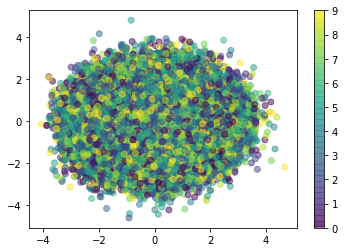

In [7]:
latent = torch.load(model_path / f"checkpoints/latent.pt")
# classes = torch.load(model_path / f"checkpoints/classes.pt")[:20000]

# latent_lt = torch.load(model_path / "checkpoints/latent_lt_0.pt")
# classes_lt = torch.load(model_path / "checkpoints/classes_lt_0.pt")

# all_data = torch.cat([latent_rs, latent_lt], dim=0)
# all_targets = torch.cat(
#             [
#                 classes,
#                 9 + classes_lt[classes_lt < 11],
#             ]
#         )
# all_targets = torch.cat(
# [
#     torch.zeros_like(classes),
#     torch.ones_like(classes_lt)
# ]
# )

print((latent == latent_rs).all())

# lda = LinearDiscriminantAnalysis(n_components=19)
lda = PCA(n_components=2)
lda.fit(latent_rs, labels)
lt = lda.transform(latent_rs)[::-1, :2]

fig, ax = plt.subplots()
m = ax.scatter(lt[:, 0], lt[:, 1], c=labels, alpha=0.5)
cb = fig.colorbar(m)
# cb.set_ticks(np.arange(0.5, 20))
# cb.set_ticklabels(list(range(10)) + ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j'])
# cb.set_ticks([0.25, 0.75])
# cb.set_ticklabels(['digits', 'letters'])
fig.show()

In [14]:
grad = torch.load(model_path / f"checkpoints/grad.pt")
print(f"EMNIST Mean: {grad.mean().item():.4f}")
print(f"EMNIST Std: {grad.std().item():.6f}")

grad_lt = torch.load(model_path / f"checkpoints/grad_lt_0.pt")
print(f"Letters Mean: {grad_lt.mean().item():.4f}")
print(f"Letters Std: {grad_lt.std().item():.6f}")

grad_km = torch.load(model_path / f"checkpoints/grad_km_0.pt")
print(f"KMNIST Mean: {grad_km.mean().item():.4f}")
print(f"KMNIST Std: {grad_km.std().item():.6f}")

EMNIST Mean: 0.0259
EMNIST Std: 0.000046
Letters Mean: 0.0256
Letters Std: 0.000047
KMNIST Mean: 0.0247
KMNIST Std: 0.000045


### Distance Matrix in LDA Space

num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)



<ipython-input-10-bc5a0b4ded87>:44: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


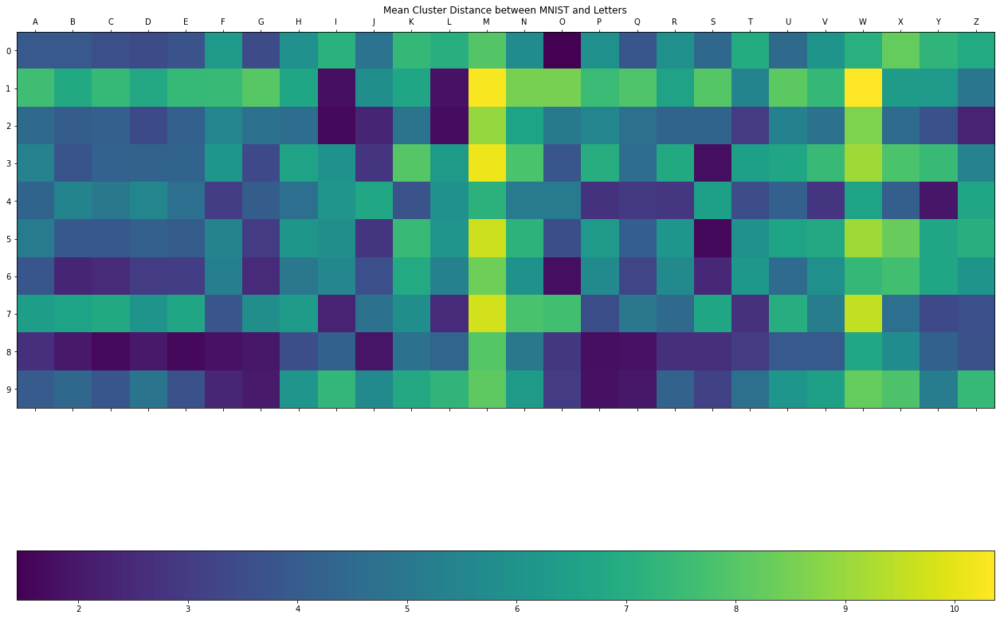

In [10]:
def plot_distance_matrix_letters(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:20000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:20000]

    d_matrix = np.zeros((10, 26))

    for i in tqdm(range(10)):

        latent_lt = torch.load(
            model_path / f"checkpoints/latent_lt_{i}.pt"
        )[:50000]
        classes_lt = torch.load(
            model_path / f"checkpoints/classes_lt_{i}.pt"
        )[:50000]

        lda = LinearDiscriminantAnalysis(n_components=2)

        all_data = torch.cat([latent[classes == i], latent_lt], dim=0)
        all_targets = torch.cat(
            [
                i * torch.ones((latent[classes == i].shape[0],), dtype=torch.long),
                10 + classes_lt,
            ]
        )
        lda.fit(all_data, all_targets)

        latent_pca = lda.transform(latent[classes == i][:1000])[:, :2]
        latent_lt_pca = lda.transform(latent_lt)[:, :2]
        print(f"num: {latent_pca.shape}")
        print(f"let: {latent_lt_pca.shape}")

        for j in range(26):
            d_matrix[i, j] = np.linalg.norm(
                latent_pca - latent_lt_pca[classes_lt == j + 1][:1000], axis=1
            ).mean()

    fig, ax = plt.subplots(figsize=(22, 22))
    m = ax.matshow(d_matrix)
    ax.set_xticks(range(26))
    ax.set_xticklabels([chr(ord("A") + i) for i in range(26)])
    ax.set_yticks(range(10))
    ax.set_title("Mean Cluster Distance between MNIST and Letters")
    fig.colorbar(m, orientation="horizontal")
    fig.show()
    
plot_distance_matrix_letters(inn, model_path)

num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)



<ipython-input-12-aca8f1d67bcb>:43: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


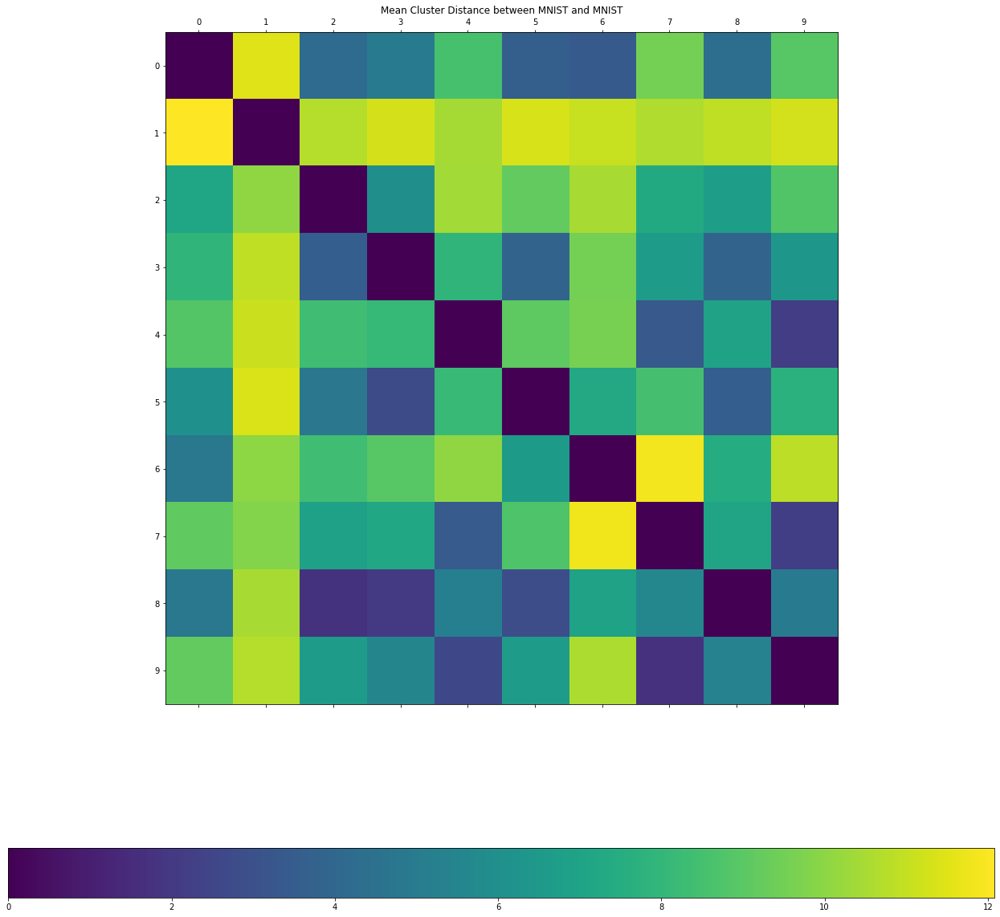

In [12]:
def plot_distance_matrix(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:20000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:20000]

    d_matrix = np.zeros((10, 10))

    for i in tqdm(range(10)):

        latent_lt = torch.load(model_path / f"checkpoints/latent_{i}.pt")[
            :50000
        ]
        classes_lt = torch.load(
            model_path / f"checkpoints/classes_{i}.pt"
        )[:50000]

        lda = LinearDiscriminantAnalysis(n_components=2)

        all_data = torch.cat([latent[classes == i], latent_lt], dim=0)
        all_targets = torch.cat(
            [
                i * torch.ones((latent[classes == i].shape[0],), dtype=torch.long),
                10 + classes_lt,
            ]
        )
        lda.fit(all_data, all_targets)

        latent_pca = lda.transform(latent[classes == i][:1000])[:, :2]
        latent_lt_pca = lda.transform(latent_lt)[:, :2]
        print(f"num: {latent_pca.shape}")
        print(f"let: {latent_lt_pca.shape}")

        for j in range(10):
            d_matrix[i, j] = np.linalg.norm(
                latent_pca - latent_lt_pca[classes_lt == j][:1000], axis=1
            ).mean()

    fig, ax = plt.subplots(figsize=(22, 22))
    m = ax.matshow(d_matrix)
    ax.set_xticks(range(10))
    ax.set_yticks(range(10))
    ax.set_title("Mean Cluster Distance between MNIST and MNIST")
    fig.colorbar(m, orientation="horizontal")
    fig.show()
    
plot_distance_matrix(inn, model_path)

### Silhouette Score in LDA Space

<ipython-input-14-7aa342605a27>:35: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


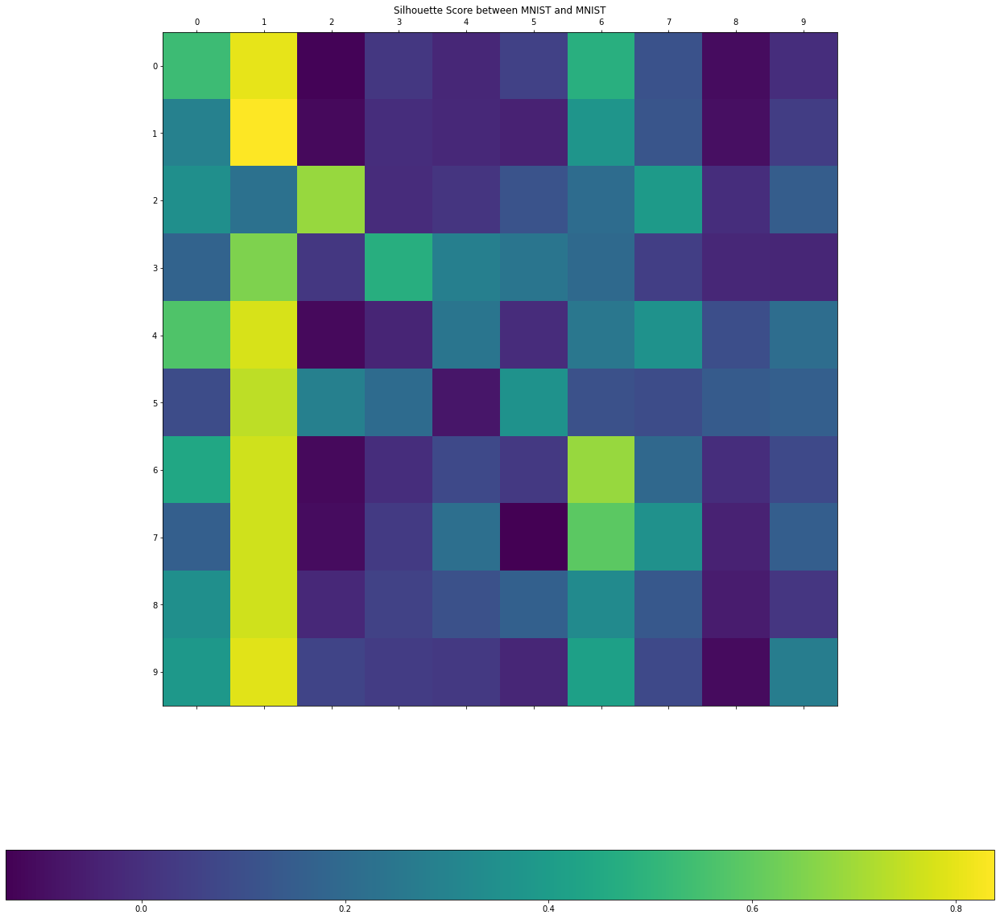

In [14]:
def plot_silhouette_score(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:5000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:5000]

    silhouettes = np.zeros((10, 10))

    for i in tqdm(range(10)):

        latent_lt = torch.load(model_path / f"checkpoints/latent_{i}.pt")[
            :10000
        ]
        classes_lt = torch.load(
            model_path / f"checkpoints/classes_{i}.pt"
        )[:10000]
        
        lda = LinearDiscriminantAnalysis(n_components=2)

        all_data = torch.cat([latent[classes == i], latent_lt], dim=0)
        all_targets = torch.cat(
            [i * torch.ones((latent[classes == i].shape[0],), dtype=torch.long), classes_lt]
        )
        lda.fit(all_data, all_targets)
        all_data = lda.transform(all_data)[:, :2]

        silhouette = metrics.silhouette_samples(all_data, all_targets, metric="euclidean")
        for j in range(10):
            silhouettes[i, j] = silhouette[all_targets == j].mean()

    fig, ax = plt.subplots(figsize=(22, 22))
    m = ax.matshow(silhouettes)
    ax.set_xticks(range(10))
    ax.set_yticks(range(10))
    ax.set_title("Silhouette Score between MNIST and MNIST")
    fig.colorbar(m, orientation="horizontal")
    fig.show()
    
plot_silhouette_score(inn, model_path)

<ipython-input-15-0f808cf303ec>:38: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


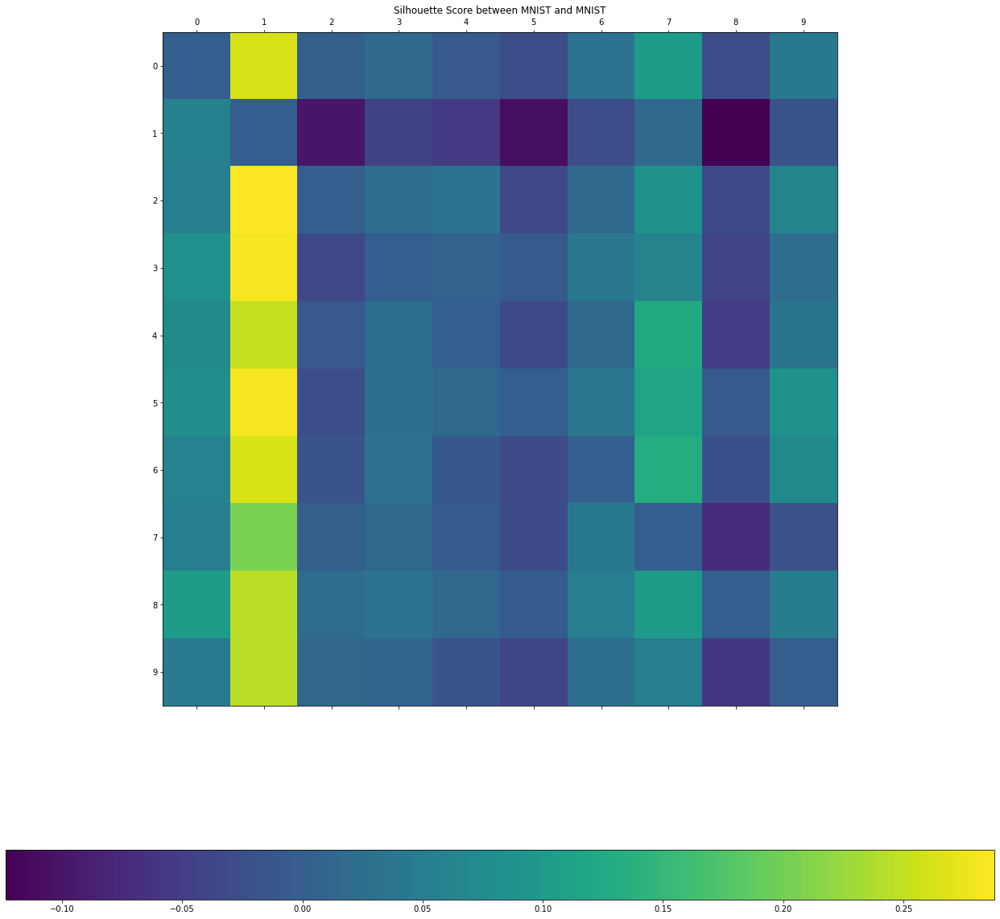

In [15]:
def plot_sihouette_no_lda(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:5000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:5000]

    silhouettes = np.zeros((10, 10))

    for i in tqdm(range(10)):

        latent_lt = torch.load(model_path / f"checkpoints/latent_{i}.pt")[
            :10000
        ]
        classes_lt = torch.load(
            model_path / f"checkpoints/classes_{i}.pt"
        )[:10000]

        for j in range(10):
            if i == j:
                continue

            all_data = latent_lt[np.logical_or(classes_lt == i, classes_lt == j).to(bool)]
            all_targets = classes_lt[
                np.logical_or(classes_lt == i, classes_lt == j).to(bool)
            ]
            #     lda.fit(all_data, all_targets)
            #     all_data = lda.transform(all_data)[:, :2]

            silhouette = metrics.silhouette_samples(
                all_data, all_targets, metric="euclidean"
            )
            silhouettes[i, j] = silhouette[all_targets == j].mean()

    fig, ax = plt.subplots(figsize=(22, 22))
    m = ax.matshow(silhouettes)
    ax.set_xticks(range(10))
    ax.set_yticks(range(10))
    ax.set_title("Silhouette Score between MNIST and MNIST")
    fig.colorbar(m, orientation="horizontal")
    fig.show()
    
plot_sihouette_no_lda(inn, model_path)

<ipython-input-16-6d857e055314>:47: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


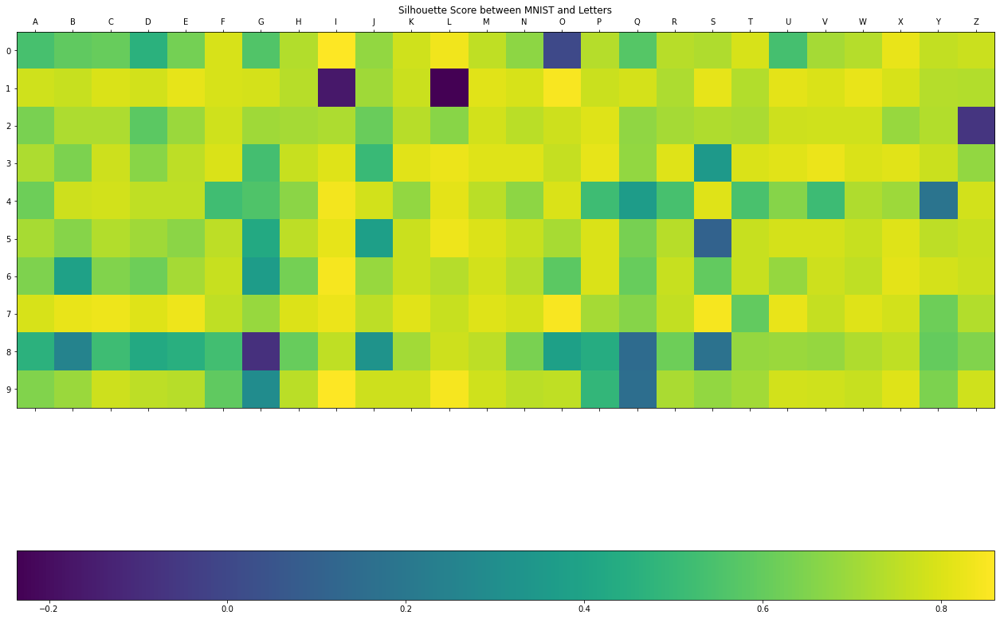

In [16]:
def plot_silhouette_score_letters(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:10000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:10000]

    silhouettes = np.zeros((10, 26))

    for i in tqdm(range(10)):
        classes_lt = torch.load(
            model_path / f"checkpoints/classes_lt_{i}.pt"
        )
        latent_lt = torch.load(
            model_path / f"checkpoints/latent_lt_{i}.pt"
        )

        lda = LinearDiscriminantAnalysis(n_components=2)
        
        all_data = torch.cat([latent[classes == i], latent_lt[:10000]], dim=0)
        all_targets = torch.cat(
            [
                i * torch.ones((latent[classes == i].shape[0],), dtype=torch.long),
                10 + classes_lt[:10000],
            ]
        )
        lda.fit(all_data, all_targets)
        all_data = torch.tensor(lda.transform(all_data)[:, :2])

        for j in range(1, 27):
            class_data = all_data[
                np.logical_or(all_targets == i, all_targets == 10 + j).to(bool)
            ]
            class_targets = all_targets[
                np.logical_or(all_targets == i, all_targets == 10 + j).to(bool)
            ]
            silhouette = metrics.silhouette_samples(
                class_data, class_targets, metric="euclidean"
            )

            silhouettes[i, j - 1] = silhouette[class_targets == 10 + j].mean()

    fig, ax = plt.subplots(figsize=(22, 22))
    m = ax.matshow(silhouettes)
    ax.set_xticks(range(26))
    ax.set_xticklabels([chr(ord("A") + i) for i in range(26)])
    ax.set_yticks(range(10))
    ax.set_title("Silhouette Score between MNIST and Letters")
    fig.colorbar(m, orientation="horizontal")
    fig.show()
    
plot_silhouette_score_letters(inn, model_path)

### LDA Scatter Plots

<ipython-input-17-f7d78df7abef>:55: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


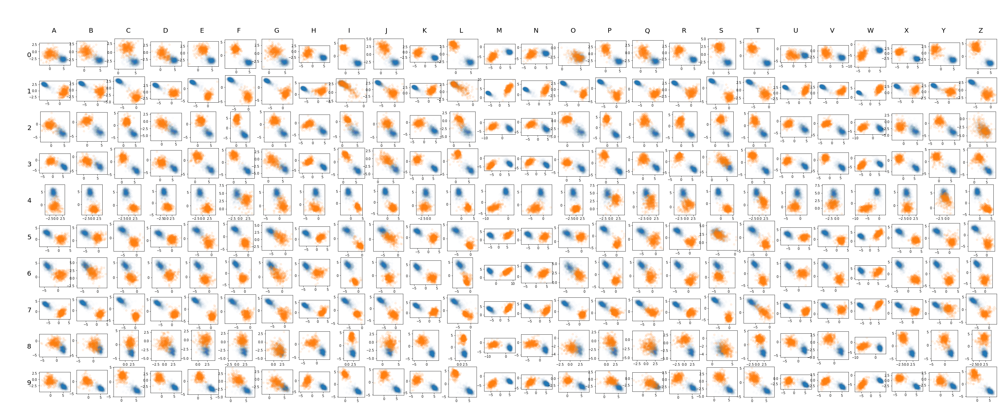

In [17]:
def plot_lda_scatter_letters(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:10000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:10000]

    fig, axes = plt.subplots(11, 27, figsize=(54, 22))

    for i in tqdm(range(10)):

        latent_lt = torch.load(
            model_path / f"checkpoints/latent_lt_{i}.pt"
        )[:10000]
        classes_lt = torch.load(
            model_path / f"checkpoints/classes_lt_{i}.pt"
        )[:10000]

        lda = LinearDiscriminantAnalysis(n_components=2)

        all_data = torch.cat([latent[classes == i], latent_lt], dim=0)
        all_targets = torch.cat(
            [
                i * torch.ones((latent[classes == i].shape[0],), dtype=torch.long),
                10 + classes_lt,
            ]
        )
        lda.fit(all_data, all_targets)

        latent_pca = lda.transform(latent[classes == i])
        latent_lt_pca = lda.transform(latent_lt)

        for j in range(26):

            ax = axes[i + 1, j + 1]

            ax.scatter(latent_pca[:, 0], latent_pca[:, 1], alpha=0.01)
            ax.scatter(
                latent_lt_pca[classes_lt == (j + 1)][:, 0],
                latent_lt_pca[:, 1][classes_lt == (j + 1)],
                alpha=0.1,
            )

            ax.set_aspect("equal")

    axes[0, 0].set_axis_off()

    ltrs = [chr(ord("A") + i) for i in range(26)]

    for i in range(26):
        axes[0, i + 1].annotate(ltrs[i], (0.4, 0), fontsize=20)
        axes[0, i + 1].set_axis_off()

    for i in range(10):
        axes[i + 1, 0].annotate(f"{i}", (0.8, 0.4), fontsize=20)
        axes[i + 1, 0].set_axis_off()

    fig.show()
    
plot_lda_scatter_letters(inn, model_path)

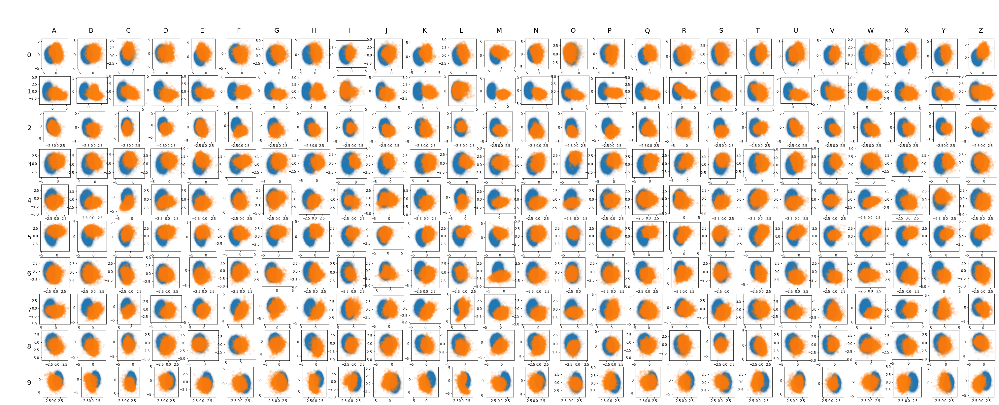

In [30]:
latent = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/latent.pt")
classes = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/classes.pt")

fig, axes = plt.subplots(11, 27, figsize=(54, 22))

for i in range(10):

    _, _, v = torch.svd(latent[classes == i])
    latent_pca = (latent[classes == i]) @ v[:, :2]
    latent_lt = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/latent_lt_{i}.pt")
    classes_lt = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/classes_lt_{i}.pt")
    latent_lt_pca = latent_lt @ v[:, :2]

    for j in range(26):

        ax = axes[i + 1, j + 1]

        ax.scatter(latent_pca[:, 0], latent_pca[:, 1], alpha=0.01)
        ax.scatter(
            latent_lt_pca[classes_lt == (j + 1)][:, 0],
            latent_lt_pca[:, 1][classes_lt == (j + 1)],
            alpha=0.1,
        )

        ax.set_aspect("equal")

axes[0, 0].set_axis_off()

ltrs = [chr(ord("A") + i) for i in range(26)]

for i in range(26):
    axes[0, i + 1].annotate(ltrs[i], (0.4, 0), fontsize=20)
    axes[0, i + 1].set_axis_off()

for i in range(10):
    axes[i + 1, 0].annotate(f"{i}", (0.8, 0.4), fontsize=20)
    axes[i + 1, 0].set_axis_off()

fig.show()

<ipython-input-18-a01edac79b3f>:66: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


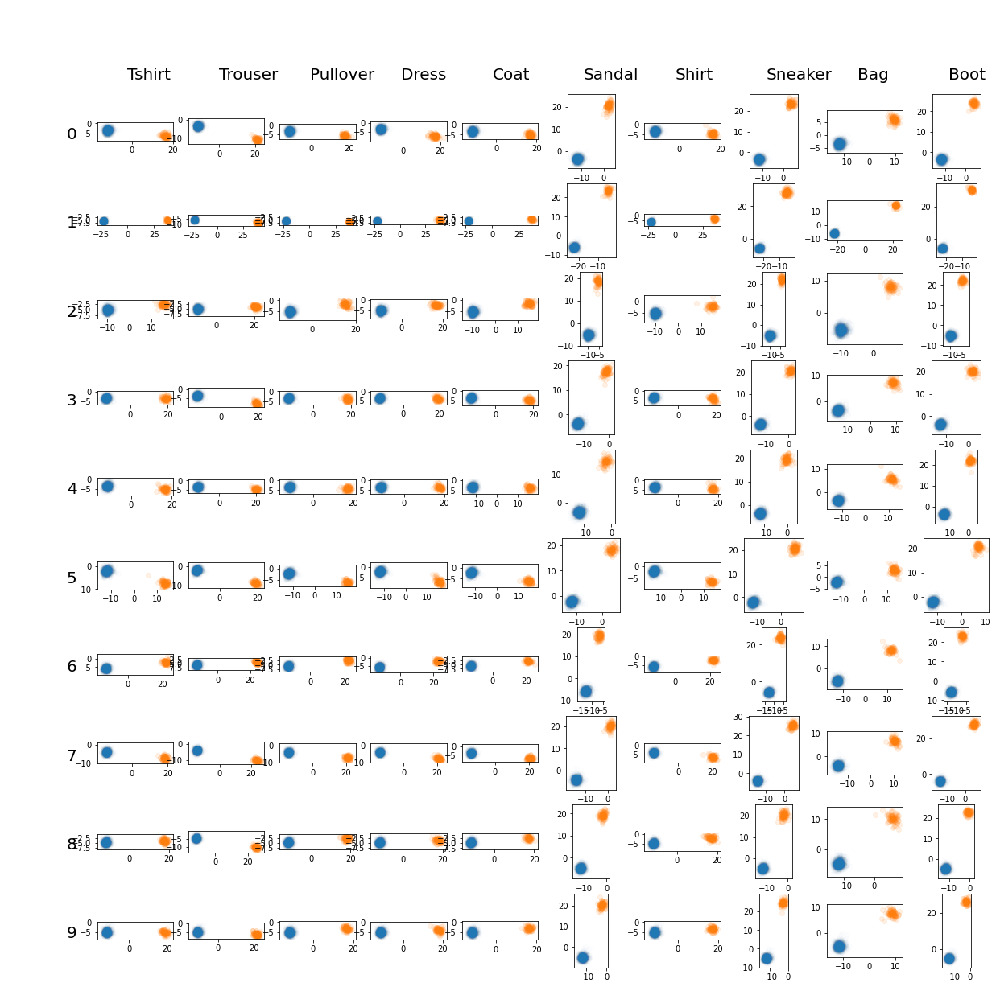

In [18]:
def plot_lda_scatter_fashion(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:10000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:10000]

    fig, axes = plt.subplots(11, 11, figsize=(22, 22))

    for i in tqdm(range(10)):

        latent_fs = torch.load(model_path / f"checkpoints/latent_fs_{i}.pt")[
            :1000
        ]
        classes_fs = torch.load(
            model_path / f"checkpoints/classes_fs_{i}.pt"
        )[:1000]

        lda = LinearDiscriminantAnalysis(n_components=2)

        all_data = torch.cat([latent[classes == i], latent_fs], dim=0)
        all_targets = torch.cat(
            [
                i * torch.ones((latent[classes == i].shape[0],), dtype=torch.long),
                10 + classes_fs,
            ]
        )
        lda.fit(all_data, all_targets)

        latent_pca = lda.transform(latent[classes == i])
        latent_fs_pca = lda.transform(latent_fs)

        for j in range(10):

            ax = axes[i + 1, j + 1]

            ax.scatter(latent_pca[:, 0], latent_pca[:, 1], alpha=0.01)
            ax.scatter(
                latent_fs_pca[classes_fs == j][:, 0],
                latent_fs_pca[:, 1][classes_fs == j],
                alpha=0.1,
            )

            ax.set_aspect("equal")

    axes[0, 0].set_axis_off()

    ltrs = [
        "Tshirt",
        "Trouser",
        "Pullover",
        "Dress",
        "Coat",
        "Sandal",
        "Shirt",
        "Sneaker",
        "Bag",
        "Boot",
    ]

    for i in range(10):
        axes[0, i + 1].annotate(ltrs[i], (0.4, 0), fontsize=20)
        axes[0, i + 1].set_axis_off()

    for i in range(10):
        axes[i + 1, 0].annotate(f"{i}", (0.8, 0.4), fontsize=20)
        axes[i + 1, 0].set_axis_off()

    fig.show()
    
plot_lda_scatter_fashion(inn, model_path)

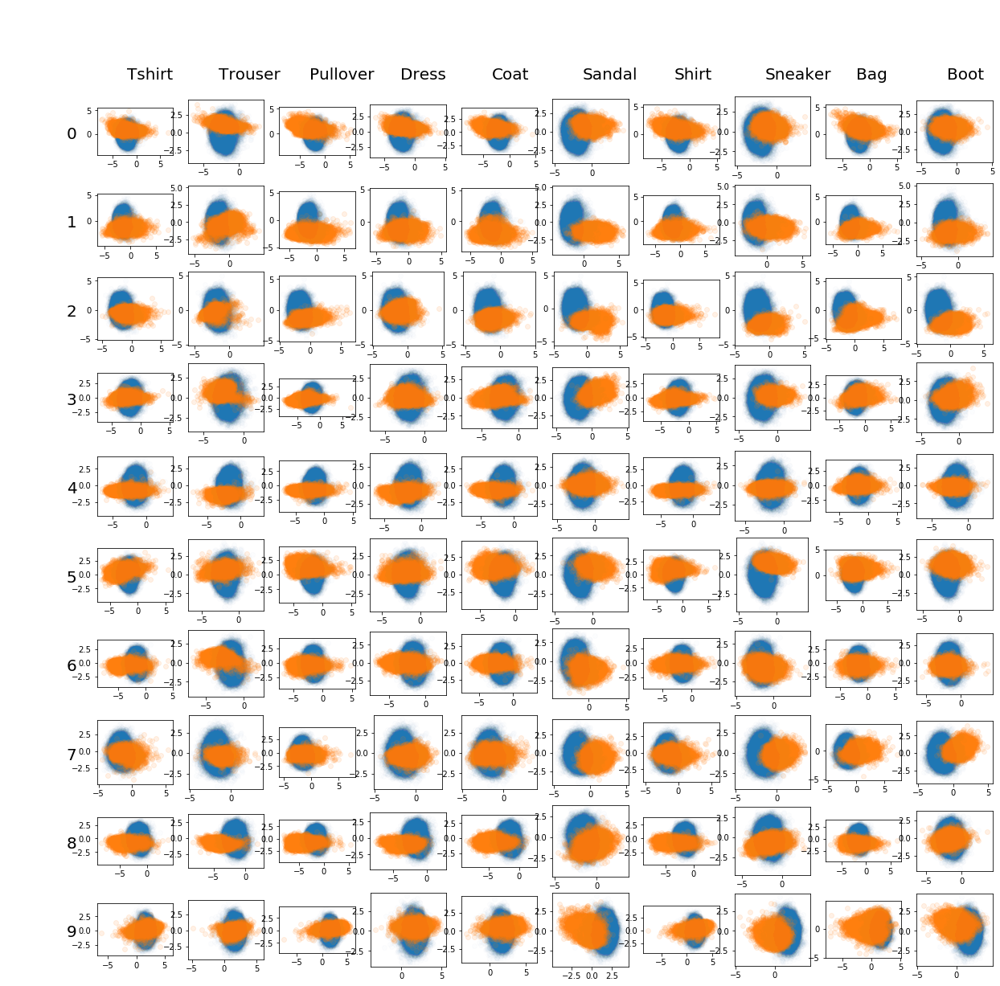

In [3]:
latent = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/latent.pt")
classes = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/classes.pt")

fig, axes = plt.subplots(11, 11, figsize=(22, 22))

for i in range(10):

    _, _, v = torch.svd(latent[classes == i])
    latent_pca = (latent[classes == i]) @ v[:, :2]
    latent_fs = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/latent_fs_{i}.pt")
    classes_fs = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/classes_fs_{i}.pt")
    latent_fs_pca = latent_fs @ v[:, :2]

    for j in range(10):

        ax = axes[i + 1, j + 1]

        ax.scatter(latent_pca[:, 0], latent_pca[:, 1], alpha=0.01)
        ax.scatter(
            latent_fs_pca[classes_fs == j][:, 0],
            latent_fs_pca[:, 1][classes_fs == j],
            alpha=0.1,
        )

        ax.set_aspect("equal")

axes[0, 0].set_axis_off()

ltrs = [
    "Tshirt",
    "Trouser",
    "Pullover",
    "Dress",
    "Coat",
    "Sandal",
    "Shirt",
    "Sneaker",
    "Bag",
    "Boot",
]

for i in range(10):
    axes[0, i + 1].annotate(ltrs[i], (0.4, 0), fontsize=20)
    axes[0, i + 1].set_axis_off()

for i in range(10):
    axes[i + 1, 0].annotate(f"{i}", (0.8, 0.4), fontsize=20)
    axes[i + 1, 0].set_axis_off()

fig.show()

<ipython-input-19-06907d9ef8d9>:53: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


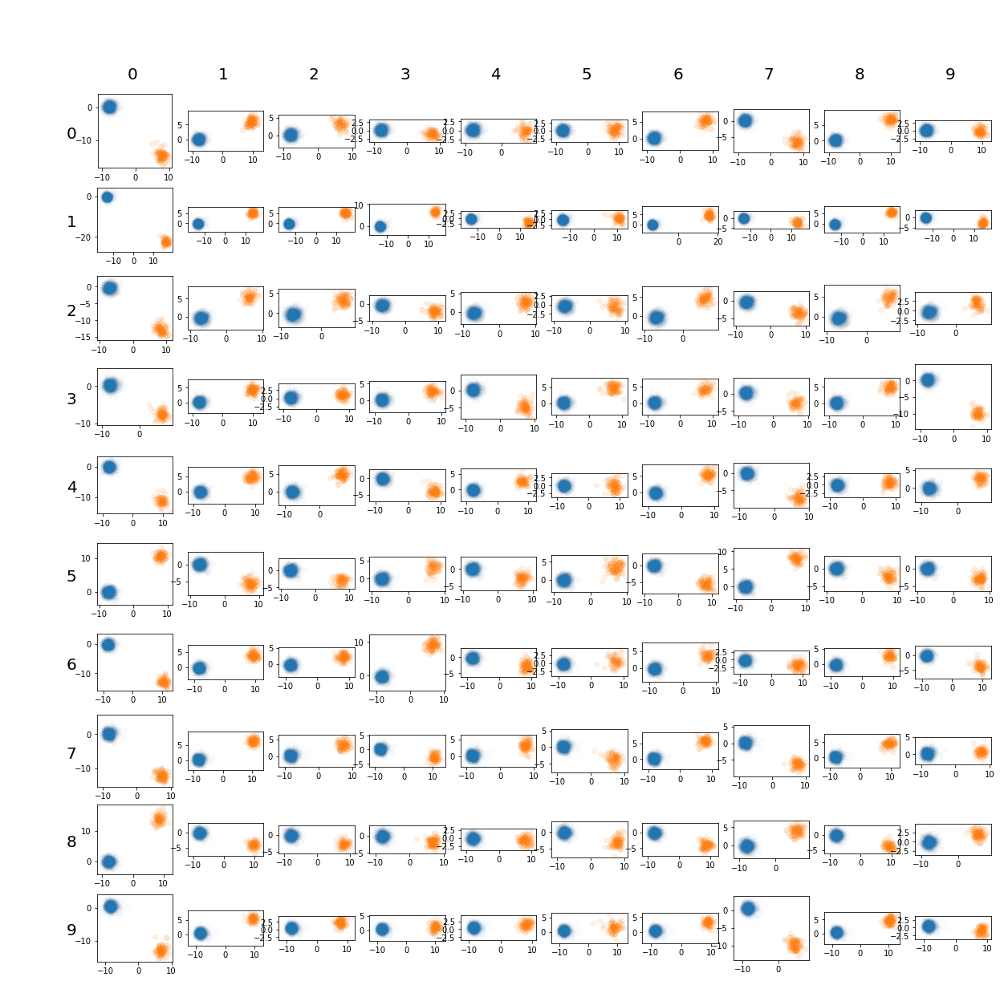

In [19]:
def plot_lda_scatter_kmnist(inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")[:10000]
    classes = torch.load(model_path / f"checkpoints/classes.pt")[:10000]

    fig, axes = plt.subplots(11, 11, figsize=(22, 22))

    for i in tqdm(range(10)):

        latent_km = torch.load(model_path / f"checkpoints/latent_km_{i}.pt")[
            :1000
        ]
        classes_km = torch.load(
            model_path / f"checkpoints/classes_km_{i}.pt"
        )[:1000]

        lda = LinearDiscriminantAnalysis(n_components=2)

        all_data = torch.cat([latent[classes == i], latent_km], dim=0)
        all_targets = torch.cat(
            [
                i * torch.ones((latent[classes == i].shape[0],), dtype=torch.long),
                10 + classes_km,
            ]
        )
        lda.fit(all_data, all_targets)

        latent_pca = lda.transform(latent[classes == i])
        latent_km_pca = lda.transform(latent_km)

        for j in range(10):

            ax = axes[i + 1, j + 1]

            ax.scatter(latent_pca[:, 0], latent_pca[:, 1], alpha=0.01)
            ax.scatter(
                latent_km_pca[classes_km == j][:, 0],
                latent_km_pca[:, 1][classes_km == j],
                alpha=0.1,
            )

            ax.set_aspect("equal")

    axes[0, 0].set_axis_off()

    for i in range(10):
        axes[0, i + 1].annotate(f"{i}", (0.4, 0), fontsize=20)
        axes[0, i + 1].set_axis_off()

    for i in range(10):
        axes[i + 1, 0].annotate(f"{i}", (0.8, 0.4), fontsize=20)
        axes[i + 1, 0].set_axis_off()

    fig.show()
    
plot_lda_scatter_kmnist(inn, model_path)

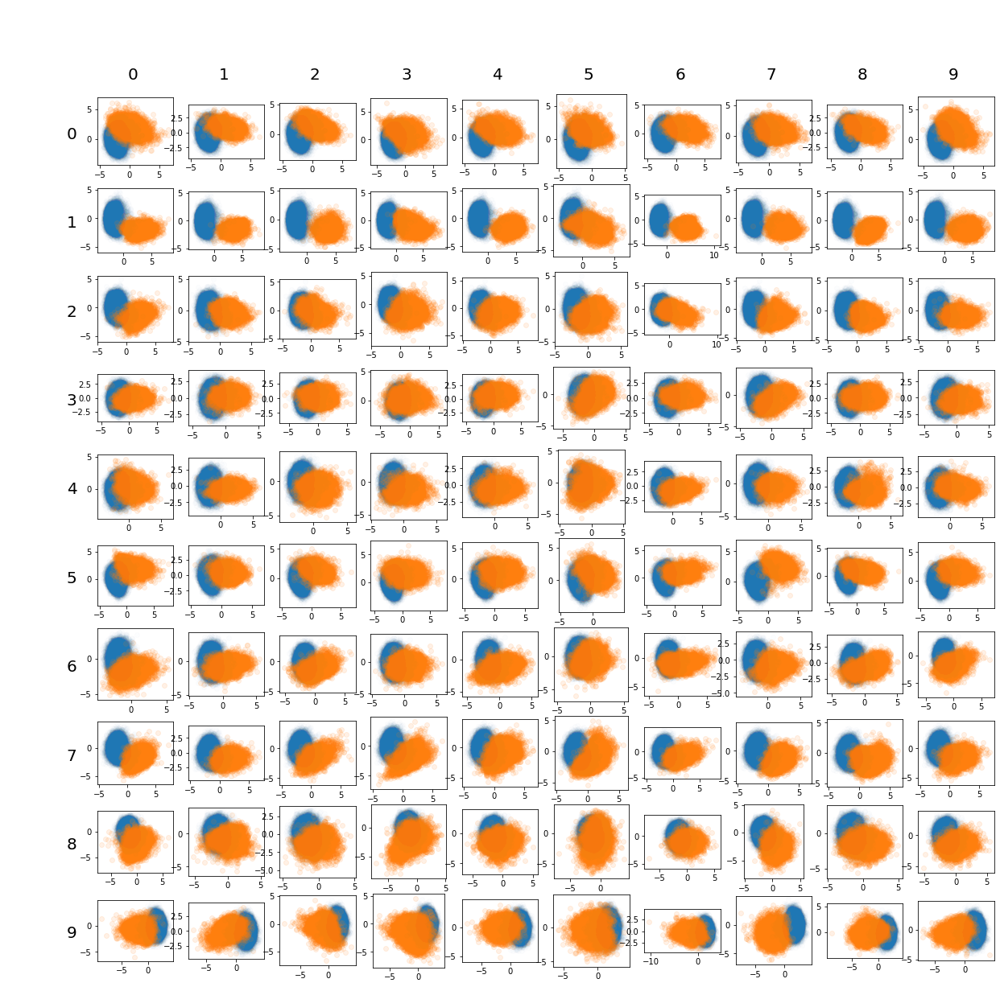

In [4]:
latent = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/latent.pt")
classes = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/classes.pt")

fig, axes = plt.subplots(11, 11, figsize=(22, 22))

for i in range(10):

    _, _, v = torch.svd(latent[classes == i])
    latent_pca = (latent[classes == i]) @ v[:, :2]
    latent_km = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/latent_km_{i}.pt")
    classes_km = torch.load(f"runs/May13_19-39-26_GLaDOS/checkpoints/classes_km_{i}.pt")
    latent_km_pca = latent_km @ v[:, :2]

    for j in range(10):

        ax = axes[i + 1, j + 1]

        ax.scatter(latent_pca[:, 0], latent_pca[:, 1], alpha=0.01)
        ax.scatter(
            latent_km_pca[classes_km == j][:, 0],
            latent_km_pca[:, 1][classes_km == j],
            alpha=0.1,
        )

        ax.set_aspect("equal")

axes[0, 0].set_axis_off()

for i in range(10):
    axes[0, i + 1].annotate(f"{i}", (0.4, 0), fontsize=20)
    axes[0, i + 1].set_axis_off()

for i in range(10):
    axes[i + 1, 0].annotate(f"{i}", (0.8, 0.4), fontsize=20)
    axes[i + 1, 0].set_axis_off()

fig.show()

### Other Plots

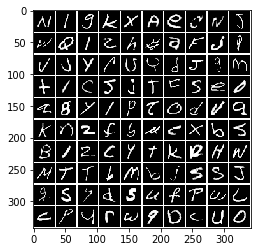

tensor([14, 12,  7, 11, 24,  1,  5,  3, 14, 10, 23, 17,  9, 26,  8,  7,  1,  6,
        10, 16, 22, 10, 25,  3, 21, 25,  4, 10,  7, 13, 20, 12,  3, 10, 10, 20,
         6, 19,  5, 15,  7,  7, 25, 12, 16, 20, 15,  4, 22, 17, 11, 14, 26,  6,
         2, 21,  3, 24,  2, 19,  2,  9, 26,  3, 25, 20, 11, 18,  8, 23, 13, 20,
        20,  2, 13,  2, 10, 19, 19, 10,  7, 19, 25,  4, 19, 21,  6, 16, 23, 12,
         3, 16, 25, 18, 23, 17,  4,  3, 21, 15])


In [50]:
def tensor2imgs(t, nrow=10):
    imgrid = torchvision.utils.make_grid(t, nrow, pad_value=1)
    return imgrid.data.mul(255).clamp(0, 255).byte().cpu().numpy()


x, y = next(iter(letter_loader))

plt.imshow(tensor2imgs(x[:100]).transpose(1, 2, 0))
plt.show()

print(y[:100])

In [ ]:
latent = torch.load(model_path / f"checkpoints/latent_lt_0.pt")[:10000]
classes = torch.load(model_path / f"checkpoints/classes_lt_0.pt")[:10000]

latent = latent[np.logical_or(classes == 1, classes == 15)]
classes = classes[np.logical_or(classes == 1, classes == 15)]

print(latent.shape)
latent_embedded = cuml.TSNE(
    verbose=6,
    learning_rate=10,
    perplexity=50,
    n_iter=2000,
    n_iter_without_progress=1000,
    early_exaggeration=20,
).fit_transform(latent.numpy())

In [ ]:
fig, ax = plt.subplots()
mp = ax.scatter(
    latent_embedded[:, 0],
    latent_embedded[:, 1],
    alpha=0.4,
    c=classes,
    cmap="tab20",
    vmin=1,
    vmax=26,
)
ax.set_aspect("equal")
fig.colorbar(mp)
fig.show()

In [14]:
print(latent_embedded.shape)

(10000, 2)


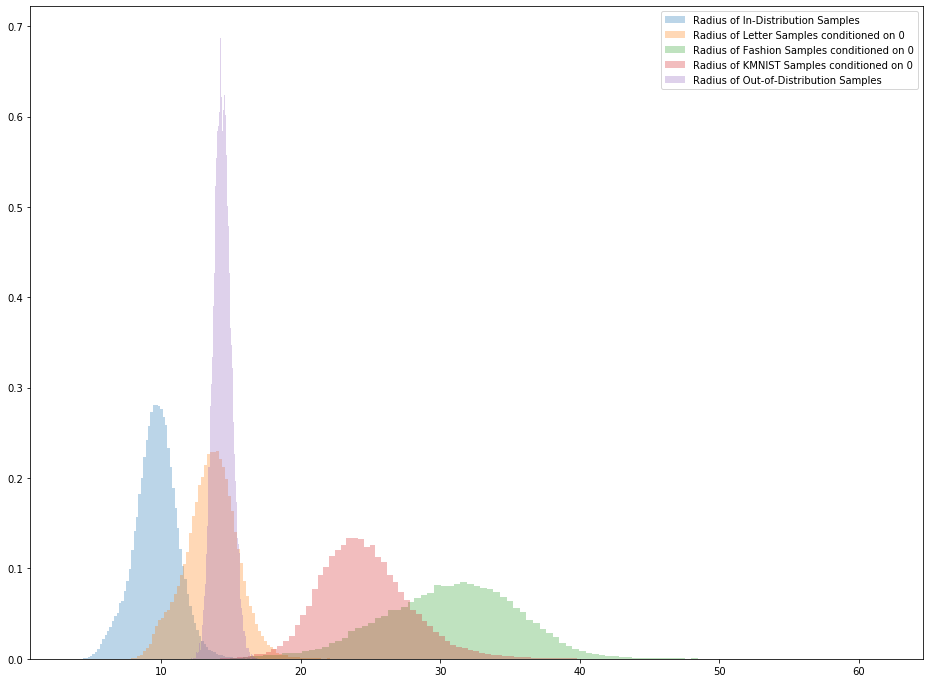

In [18]:
latent = torch.load(model_path / f"checkpoints/latent.pt")
latent_lt = torch.load(model_path / f"checkpoints/latent_lt_0.pt")
latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")

plt.figure(figsize=(16, 12))
plt.hist(
    torch.norm(latent, dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of In-Distribution Samples",
)
plt.hist(
    torch.norm(latent_lt, dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Letter Samples conditioned on 0",
)
plt.hist(
    torch.norm(latent_fs, dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Fashion Samples conditioned on 0",
)
plt.hist(
    torch.norm(latent_km, dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of KMNIST Samples conditioned on 0",
)
plt.hist(
    torch.norm(zs, dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Out-of-Distribution Samples",
)
plt.legend()
plt.show()

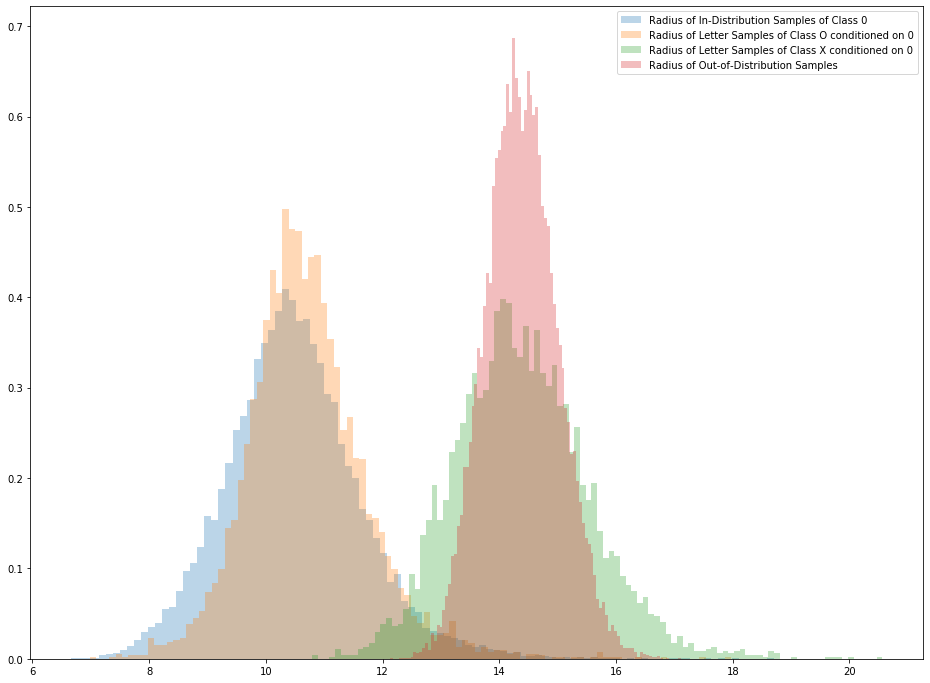

In [20]:
latent = torch.load(model_path / f"checkpoints/latent.pt")
latent_lt = torch.load(model_path / f"checkpoints/latent_lt_0.pt")
latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")
classes = torch.load(model_path / f"checkpoints/classes.pt")
classes_lt = torch.load(model_path / f"checkpoints/classes_lt_0.pt")
classes_fs = torch.load(model_path / f"checkpoints/classes_fs_0.pt")
classes_km = torch.load(model_path / f"checkpoints/classes_km_0.pt")

plt.figure(figsize=(16, 12))
plt.hist(
    torch.norm(latent[classes == 0], dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of In-Distribution Samples of Class 0",
)
plt.hist(
    torch.norm(latent_lt[classes_lt == 15], dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Letter Samples of Class O conditioned on 0",
)
plt.hist(
    torch.norm(latent_lt[classes_lt == 24], dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Letter Samples of Class X conditioned on 0",
)
# plt.hist(torch.norm(latent_fs, dim=1), bins=100, density=True,
#                      alpha=0.2)
# plt.hist(torch.norm(latent_km, dim=1), bins=100, density=True,
#                      alpha=0.2)
plt.hist(
    torch.norm(zs, dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Out-of-Distribution Samples",
)
plt.legend()
plt.show()

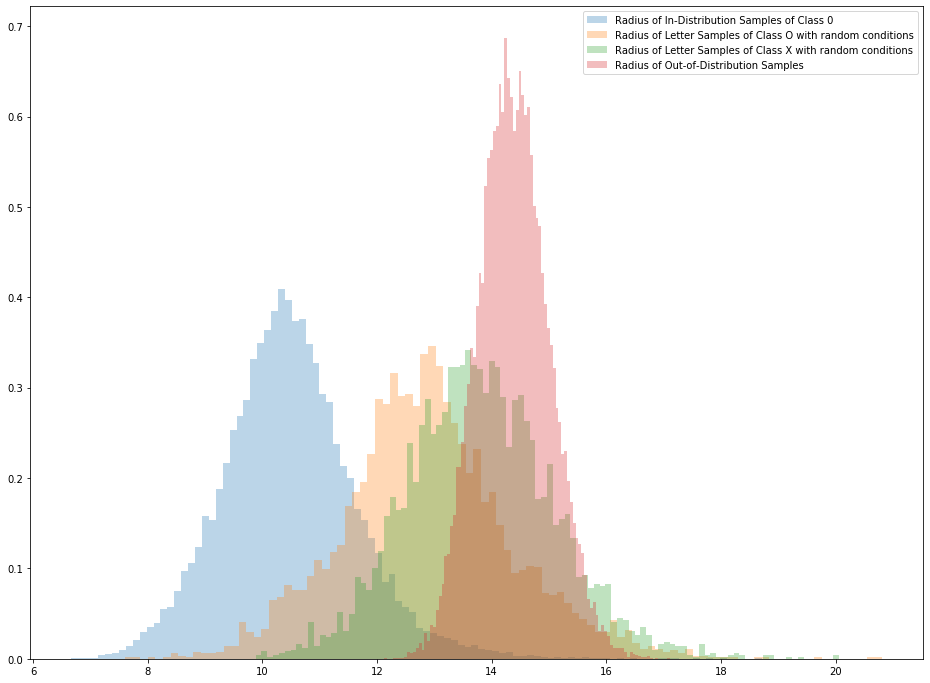

In [21]:
latent = torch.load(model_path / f"checkpoints/latent.pt")
latent_lt = torch.load(model_path / f"checkpoints/latent_lt_rand.pt")
latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")
classes = torch.load(model_path / f"checkpoints/classes.pt")
classes_lt = torch.load(model_path / f"checkpoints/classes_lt_rand.pt")
classes_fs = torch.load(model_path / f"checkpoints/classes_fs_0.pt")
classes_km = torch.load(model_path / f"checkpoints/classes_km_0.pt")

plt.figure(figsize=(16, 12))
plt.hist(
    torch.norm(latent[classes == 0], dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of In-Distribution Samples of Class 0",
)
plt.hist(
    torch.norm(latent_lt[classes_lt == 15], dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Letter Samples of Class O with random conditions",
)
plt.hist(
    torch.norm(latent_lt[classes_lt == 24], dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Letter Samples of Class X with random conditions",
)
# plt.hist(torch.norm(latent_fs, dim=1), bins=100, density=True,
#                      alpha=0.2)
# plt.hist(torch.norm(latent_km, dim=1), bins=100, density=True,
#                      alpha=0.2)
plt.hist(
    torch.norm(zs, dim=1),
    bins=100,
    density=True,
    alpha=0.3,
    label="Radius of Out-of-Distribution Samples",
)
plt.legend()
plt.show()

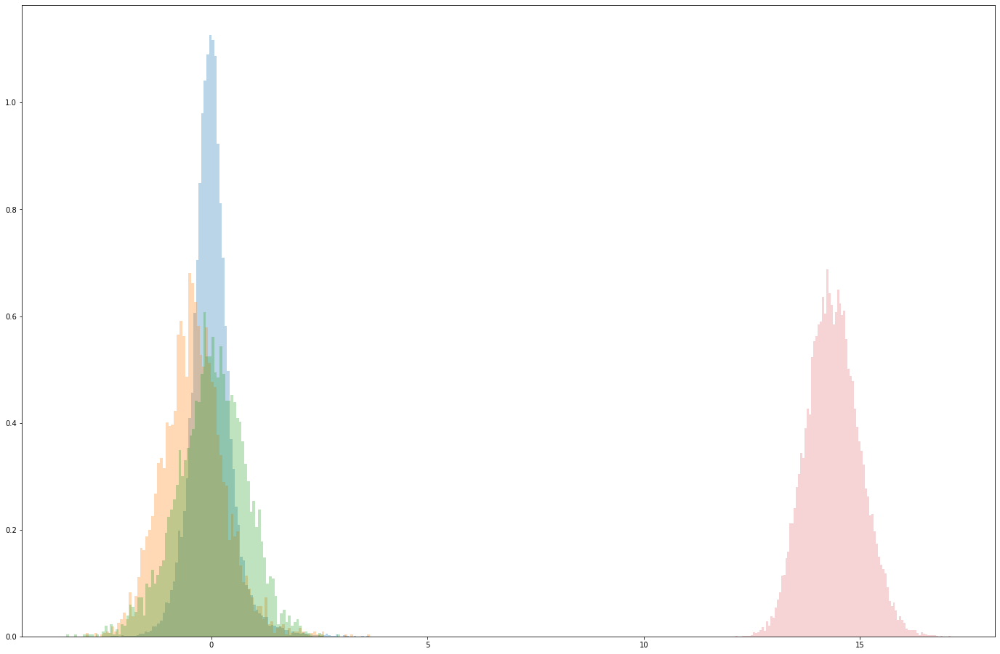

In [12]:
latent = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/latent.pt")
latent_lt = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/latent_lt_rand.pt")
latent_fs = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/latent_fs_0.pt")
latent_km = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/latent_km_0.pt")
classes = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/classes.pt")
classes_lt = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/classes_lt_rand.pt")
classes_fs = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/classes_fs_0.pt")
classes_km = torch.load("runs/May13_19-39-26_GLaDOS/checkpoints/classes_km_0.pt")

d = 20
plt.figure(figsize=(24, 16))
plt.hist(latent[classes == 0][:, d], bins=100, density=True, alpha=0.3)
plt.hist(latent_lt[classes_lt == 15][:, d], bins=100, density=True, alpha=0.3)
plt.hist(latent_lt[classes_lt == 24][:, d], bins=100, density=True, alpha=0.3)
# plt.hist(torch.norm(latent_fs, dim=1), bins=100, density=True,
#                      alpha=0.2)
# plt.hist(torch.norm(latent_km, dim=1), bins=100, density=True,
#                      alpha=0.2)
plt.hist(torch.norm(zs, dim=1), bins=100, density=True, alpha=0.2)
plt.show()

RangeIndex(start=0, stop=65, step=1)


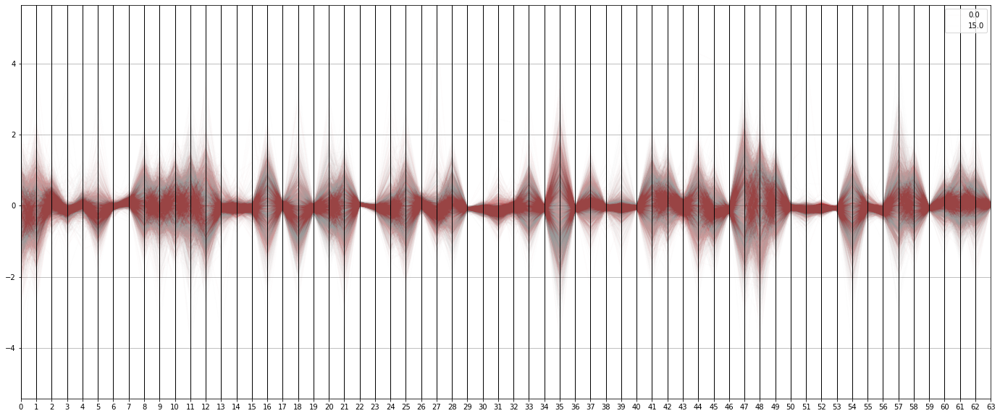

In [67]:
def parallel_plot(c1, c2, inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")
    latent_lt = torch.load(model_path / f"checkpoints/latent_lt_0.pt")
    latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
    latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")
    classes = torch.load(model_path / f"checkpoints/classes.pt")
    classes_lt = torch.load(model_path / f"checkpoints/classes_lt_0.pt")
    classes_fs = torch.load(model_path / f"checkpoints/classes_fs_0.pt")
    classes_km = torch.load(model_path / f"checkpoints/classes_km_0.pt")

    n_coords = 64
    n_samples = 2000

    ind = pd.DataFrame(
        torch.cat(
            [
                torch.cat(
                    [
                        latent[classes == c1][:n_samples, :n_coords],
                        classes[classes == c1][:n_samples].float().reshape(n_samples, 1),
                    ],
                    dim=1,
                ),
                torch.cat(
                    [
                        latent_lt[classes_lt == c2][:n_samples, :n_coords],
                        classes_lt[classes_lt == c2][:n_samples]
                        .float()
                        .reshape(n_samples, 1),
                    ],
                    dim=1,
                ),
                #         torch.cat([latent_lt[classes_lt==24][:n_samples, :n_coords], classes_lt[classes_lt==24][:n_samples].float().reshape(n_samples, 1)], dim=1),
            ],
            dim=0,
        ).numpy()
    )
    print(ind.columns)

    plt.figure(figsize=(24, 10))
    pd.plotting.parallel_coordinates(ind, n_coords, alpha=0.01, colormap="Set1")

    plt.show()

parallel_plot(0, 15, inn, model_path)

RangeIndex(start=0, stop=65, step=1)


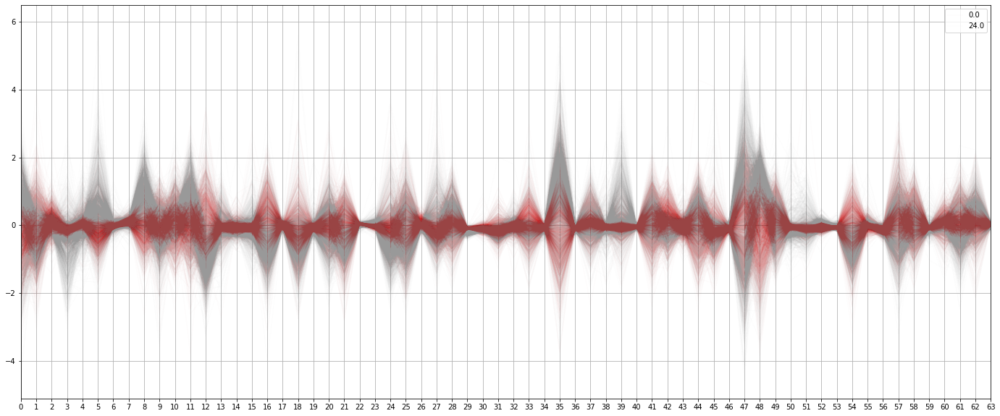

In [68]:
parallel_plot(0, 24, inn, model_path)

RangeIndex(start=0, stop=65, step=1)


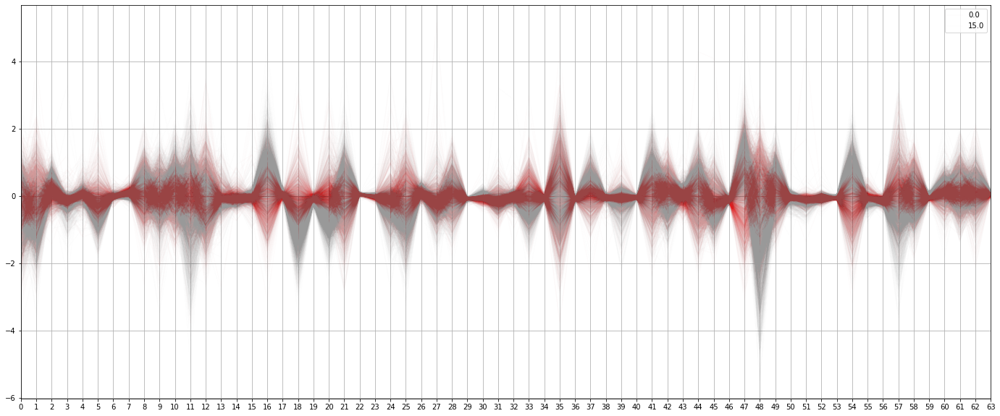

In [69]:
latent = torch.load(model_path / f"checkpoints/latent.pt")
latent_lt = torch.load(model_path / f"checkpoints/latent_lt_1.pt")
latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")
classes = torch.load(model_path / f"checkpoints/classes.pt")
classes_lt = torch.load(model_path / f"checkpoints/classes_lt_1.pt")
classes_fs = torch.load(model_path / f"checkpoints/classes_fs_0.pt")
classes_km = torch.load(model_path / f"checkpoints/classes_km_0.pt")

n_coords = 64
n_samples = 2000

ind = pd.DataFrame(
    torch.cat(
        [
            torch.cat(
                [
                    latent[classes == 0][:n_samples, :n_coords],
                    classes[classes == 0][:n_samples].float().reshape(n_samples, 1),
                ],
                dim=1,
            ),
            torch.cat(
                [
                    latent_lt[classes_lt == 15][:n_samples, :n_coords],
                    classes_lt[classes_lt == 15][:n_samples]
                    .float()
                    .reshape(n_samples, 1),
                ],
                dim=1,
            ),
            #         torch.cat([latent_lt[classes_lt==24][:n_samples, :n_coords], classes_lt[classes_lt==24][:n_samples].float().reshape(n_samples, 1)], dim=1),
        ],
        dim=0,
    ).numpy()
)
print(ind.columns)

plt.figure(figsize=(24, 10))
pd.plotting.parallel_coordinates(
    ind, n_coords, alpha=0.01, colormap="Set1", axvlines=False
)
plt.show()

RangeIndex(start=0, stop=65, step=1)


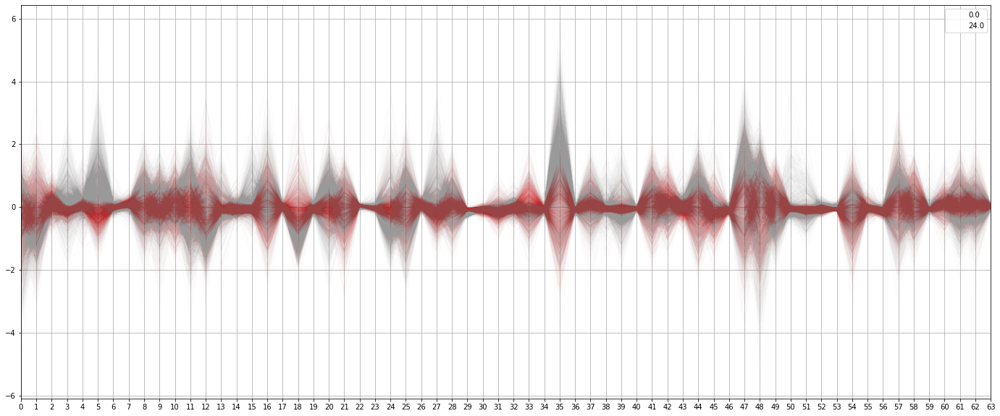

In [70]:
latent = torch.load(model_path / f"checkpoints/latent.pt")
latent_lt = torch.load(model_path / f"checkpoints/latent_lt_1.pt")
latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")
classes = torch.load(model_path / f"checkpoints/classes.pt")
classes_lt = torch.load(model_path / f"checkpoints/classes_lt_1.pt")
classes_fs = torch.load(model_path / f"checkpoints/classes_fs_0.pt")
classes_km = torch.load(model_path / f"checkpoints/classes_km_0.pt")

n_coords = 64
n_samples = 2000

ind = pd.DataFrame(
    torch.cat(
        [
            torch.cat(
                [
                    latent[classes == 0][:n_samples, :n_coords],
                    classes[classes == 0][:n_samples].float().reshape(n_samples, 1),
                ],
                dim=1,
            ),
            #         torch.cat([latent_lt[classes_lt==15][:n_samples, :n_coords], classes_lt[classes_lt==15][:n_samples].float().reshape(n_samples, 1)], dim=1),
            torch.cat(
                [
                    latent_lt[classes_lt == 24][:n_samples, :n_coords],
                    classes_lt[classes_lt == 24][:n_samples]
                    .float()
                    .reshape(n_samples, 1),
                ],
                dim=1,
            ),
        ],
        dim=0,
    ).numpy()
)
print(ind.columns)

plt.figure(figsize=(24, 10))
pd.plotting.parallel_coordinates(
    ind, n_coords, alpha=0.01, colormap="Set1", axvlines=False
)
plt.show()

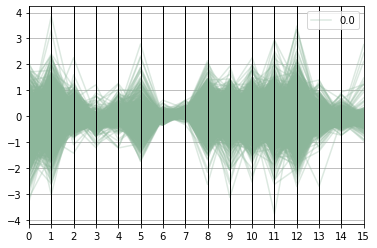

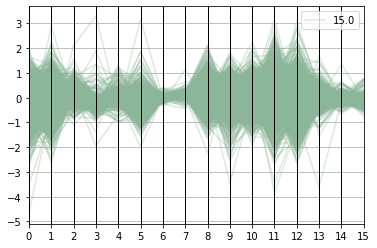

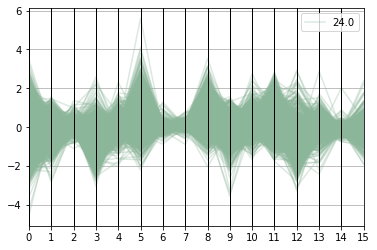

In [45]:
latent = torch.load(model_path / f"checkpoints/latent.pt")
latent_lt = torch.load(model_path / f"checkpoints/latent_lt_1.pt")
latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")
classes = torch.load(model_path / f"checkpoints/classes.pt")
classes_lt = torch.load(model_path / f"checkpoints/classes_lt_1.pt")
classes_fs = torch.load(model_path / f"checkpoints/classes_fs_0.pt")
classes_km = torch.load(model_path / f"checkpoints/classes_km_0.pt")

n_coords = 16
n_samples = 2000

ind = pd.DataFrame(
    torch.cat(
        [
            latent[classes == 0][:n_samples, :n_coords],
            classes[classes == 0][:n_samples].float().reshape(n_samples, 1),
        ],
        dim=1,
    ).numpy()
)
pd.plotting.parallel_coordinates(ind, n_coords, alpha=0.3)
plt.show()

ind = pd.DataFrame(
    torch.cat(
        [
            latent_lt[classes_lt == 15][:n_samples, :n_coords],
            classes_lt[classes_lt == 15][:n_samples].float().reshape(n_samples, 1),
        ],
        dim=1,
    ).numpy()
)
pd.plotting.parallel_coordinates(ind, n_coords, alpha=0.3)
plt.show()

ind = pd.DataFrame(
    torch.cat(
        [
            latent_lt[classes_lt == 24][:n_samples, :n_coords],
            classes_lt[classes_lt == 24][:n_samples].float().reshape(n_samples, 1),
        ],
        dim=1,
    ).numpy()
)
pd.plotting.parallel_coordinates(ind, n_coords, alpha=0.3)
plt.show()

## INN with GIN coupling

In [56]:
model_path = Path("runs/Aug26_13-35-38_GLaDOS_INN")
c = config.Config()
c.load(model_path / "checkpoints/config.toml")
c.load_inn = model_path / "checkpoints/INN.pt"
inn = INN(**c.__dict__).to(device)

[16, 32]


In [59]:
init_latent_mnist(inn, model_path)
# init_latent_conditioned(inn, model_path, train_loader)
init_latent_conditioned(inn, model_path, letter_loader, '_lt')
# init_latent_conditioned(inn, model_path, fashion_loader, '_fs')
init_latent_conditioned(inn, model_path, kmnist_loader, '_km')

num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)



<ipython-input-12-aca8f1d67bcb>:43: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


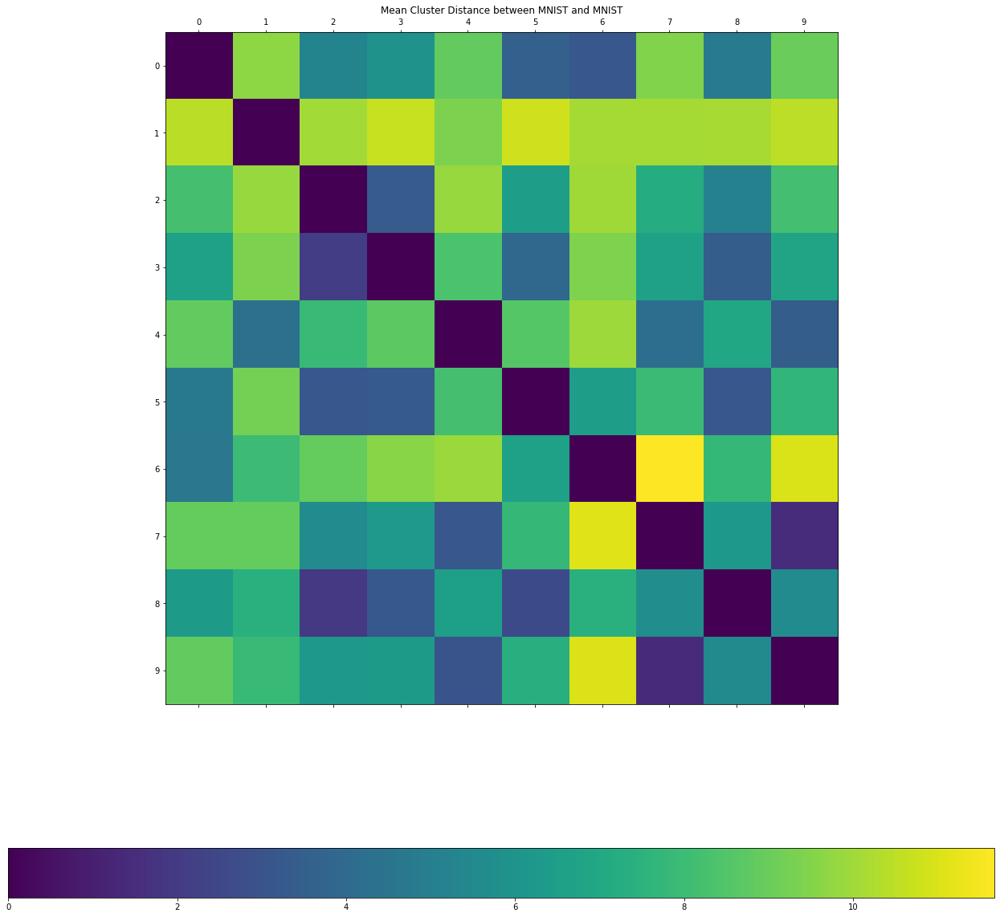

In [21]:
plot_distance_matrix(inn, model_path)

num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)
num: (1000, 2)
let: (50000, 2)



<ipython-input-10-bc5a0b4ded87>:44: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


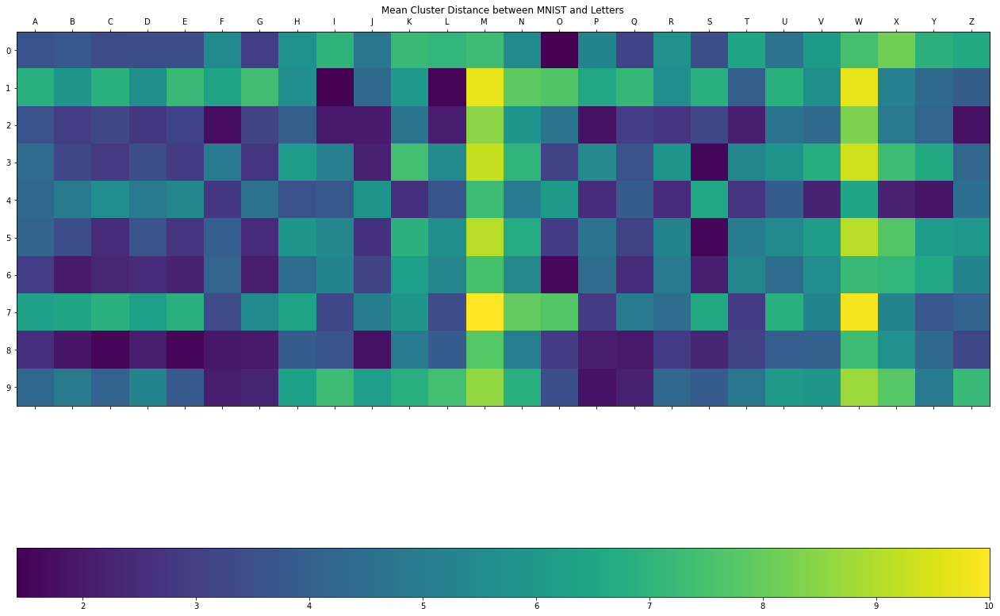

In [22]:
plot_distance_matrix_letters(inn, model_path)

<ipython-input-14-7aa342605a27>:35: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


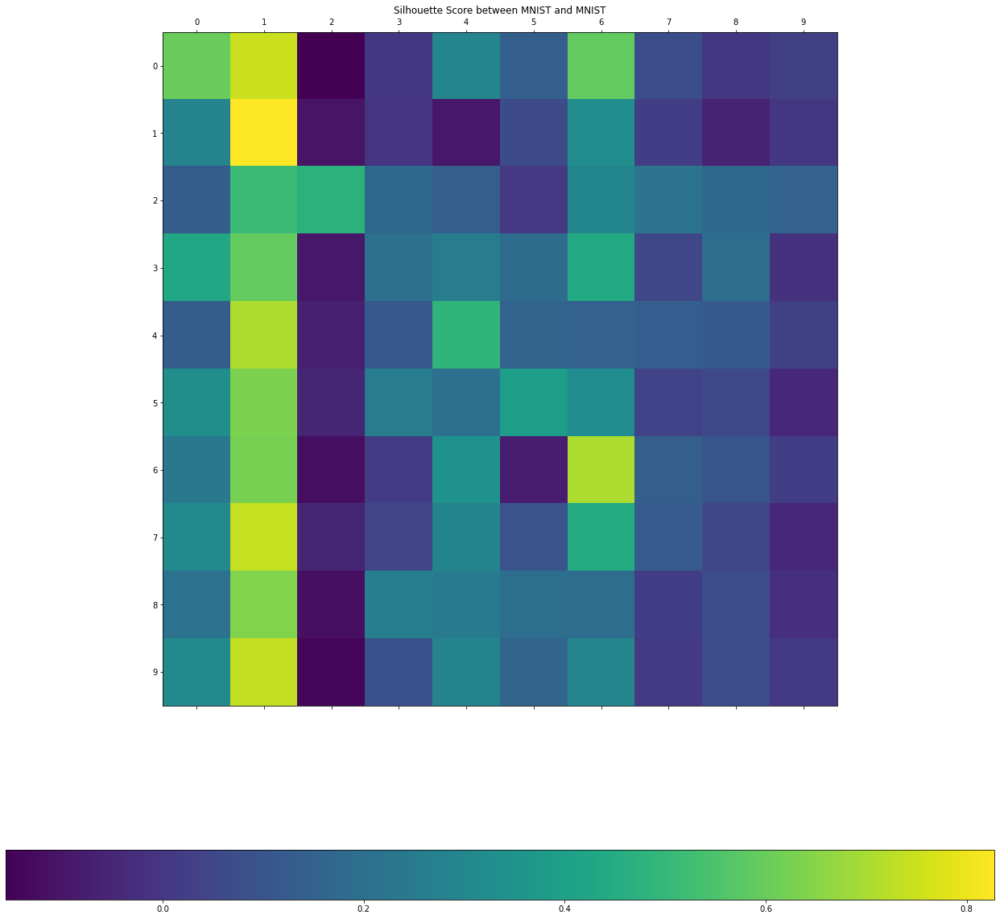

In [23]:
plot_silhouette_score(inn, model_path)

<ipython-input-15-0f808cf303ec>:38: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


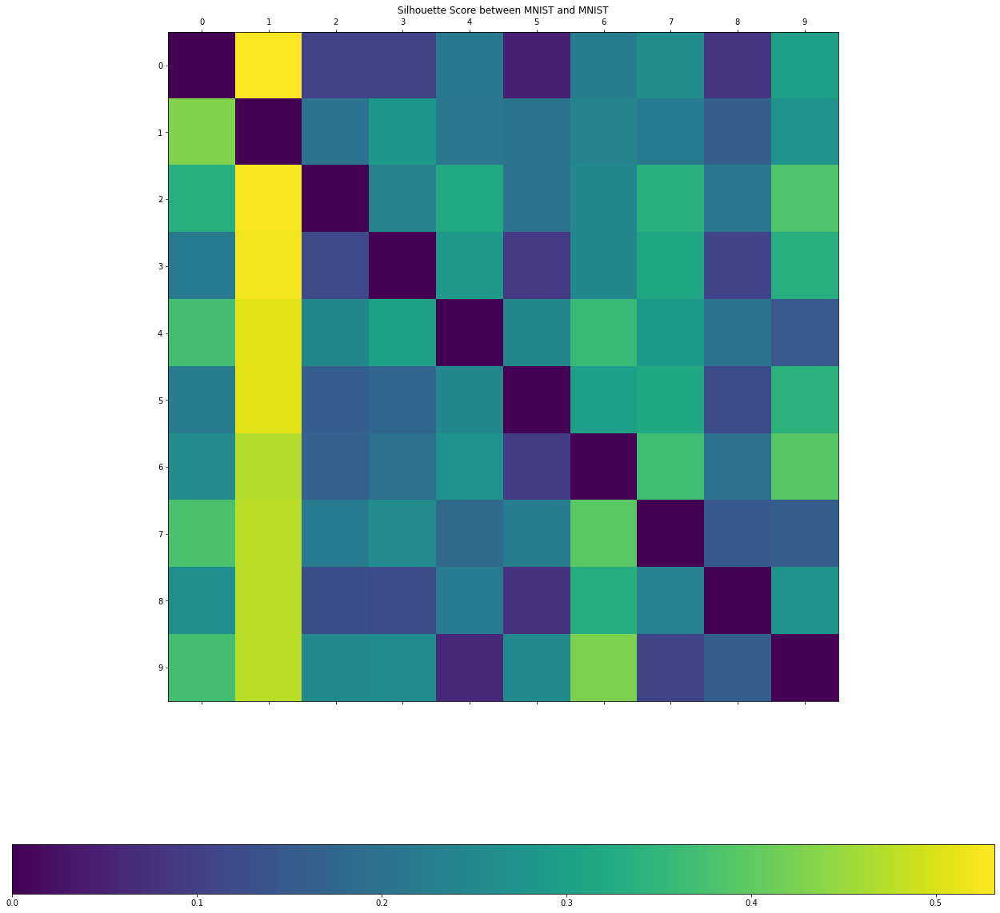

In [25]:
plot_sihouette_no_lda(inn, model_path)

<ipython-input-16-6d857e055314>:47: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


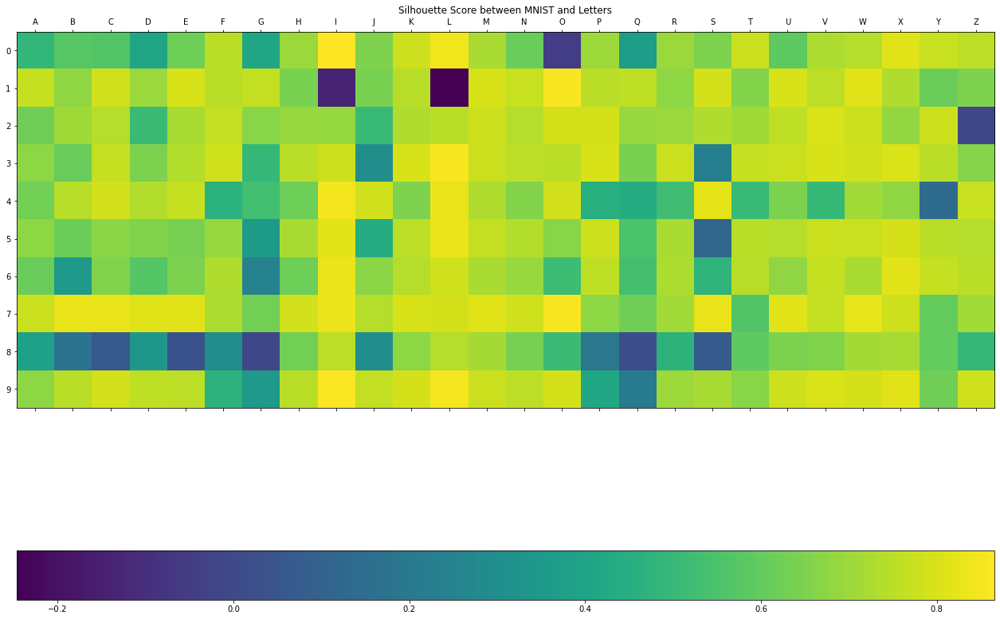

In [26]:
plot_silhouette_score_letters(inn, model_path)

<ipython-input-17-f7d78df7abef>:55: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


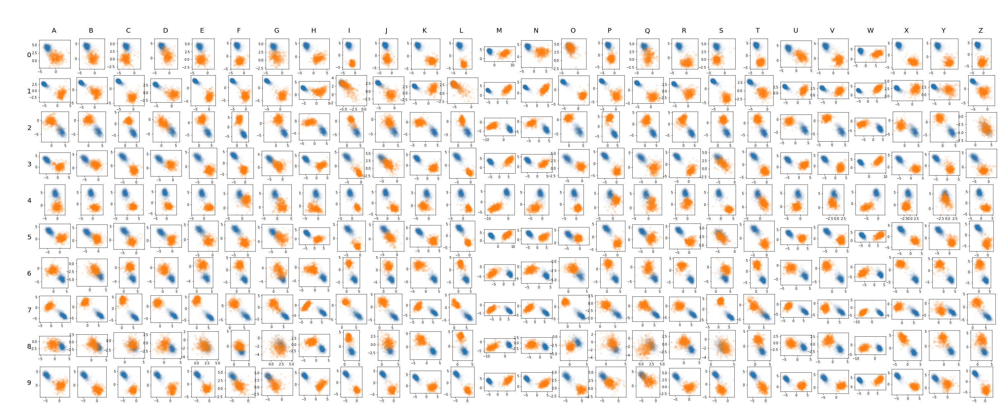

In [27]:
plot_lda_scatter_letters(inn, model_path)

<ipython-input-18-a01edac79b3f>:66: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


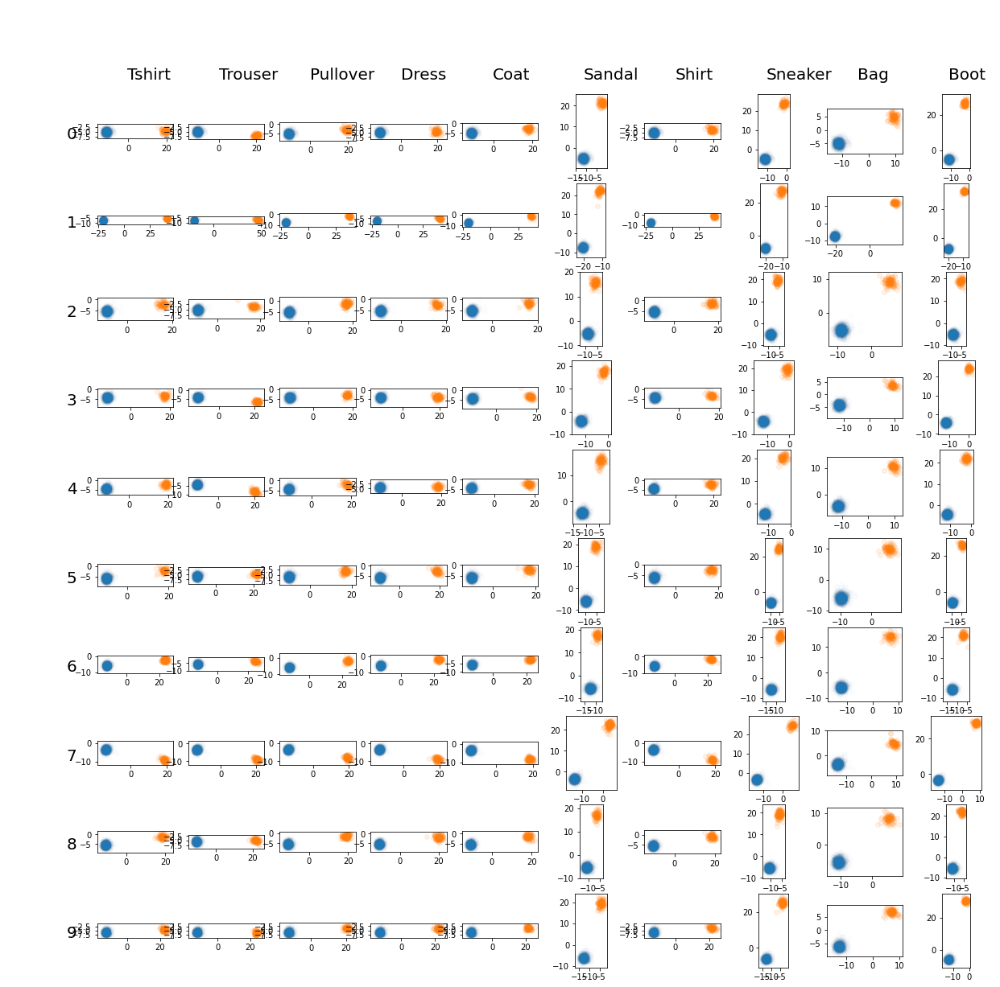

In [28]:
plot_lda_scatter_fashion(inn, model_path)

<ipython-input-19-06907d9ef8d9>:53: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


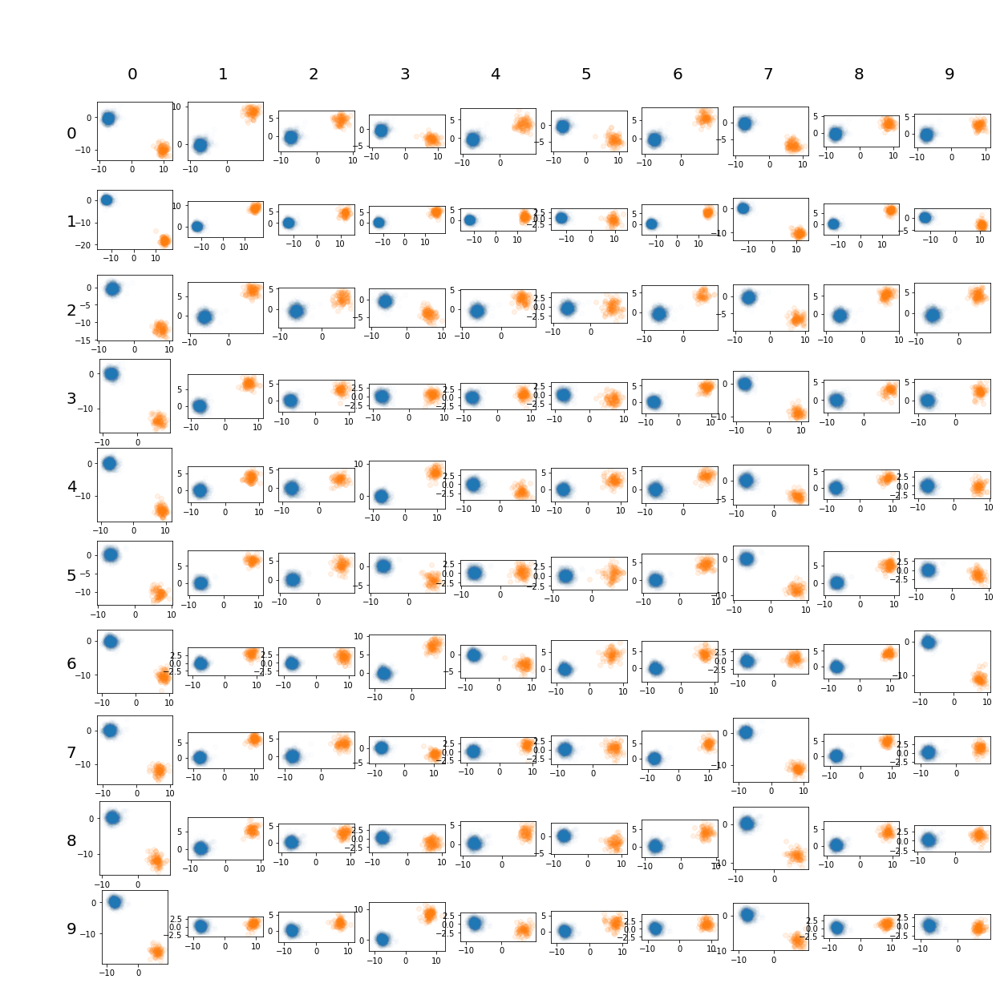

In [29]:
plot_lda_scatter_kmnist(inn, model_path)

tensor([False, False, False,  ..., False,  True, False])
RangeIndex(start=0, stop=65, step=1)


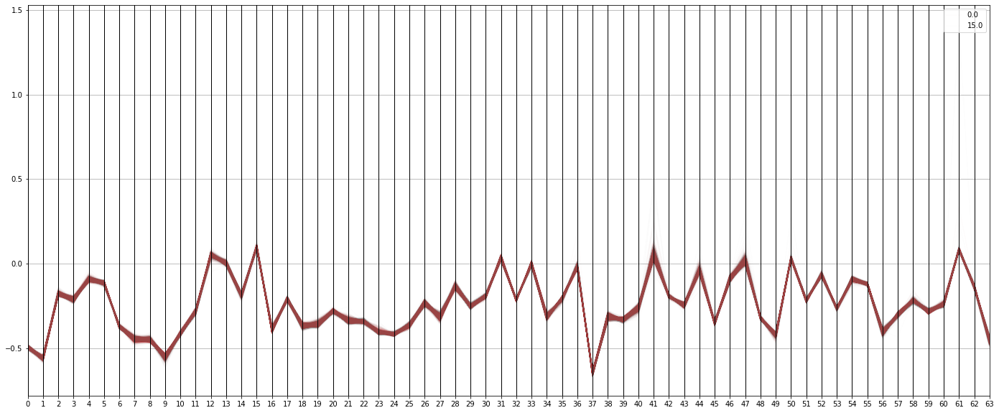

In [30]:
def parallel_plot_sorted(c1, c2, inn, model_path):
    latent = torch.load(model_path / f"checkpoints/latent.pt")
    latent_lt = torch.load(model_path / f"checkpoints/latent_lt_0.pt")
#     latent_fs = torch.load(model_path / f"checkpoints/latent_fs_0.pt")
#     latent_km = torch.load(model_path / f"checkpoints/latent_km_0.pt")
    classes = torch.load(model_path / f"checkpoints/classes.pt")
    classes_lt = torch.load(model_path / f"checkpoints/classes_lt_0.pt")
#     classes_fs = torch.load(model_path / f"checkpoints/classes_fs_0.pt")
#     classes_km = torch.load(model_path / f"checkpoints/classes_km_0.pt")
    
    index = torch.argsort(latent.std(dim=0))
    index_lt = torch.argsort(latent_lt.std(dim=0))
    print(index == index_lt)
    latent = latent[:, index]
    latent_lt = latent_lt[:, index]

    n_coords = 64
    n_samples = 2000

    ind = pd.DataFrame(
        torch.cat(
            [
                torch.cat(
                    [
                        latent[classes == c1][:n_samples, :n_coords],
                        classes[classes == c1][:n_samples].float().reshape(n_samples, 1),
                    ],
                    dim=1,
                ),
                torch.cat(
                    [
                        latent_lt[classes_lt == c2][:n_samples, :n_coords],
                        classes_lt[classes_lt == c2][:n_samples]
                        .float()
                        .reshape(n_samples, 1),
                    ],
                    dim=1,
                ),
                #         torch.cat([latent_lt[classes_lt==24][:n_samples, :n_coords], classes_lt[classes_lt==24][:n_samples].float().reshape(n_samples, 1)], dim=1),
            ],
            dim=0,
        ).numpy()
    )
    print(ind.columns)

    plt.figure(figsize=(24, 10))
    pd.plotting.parallel_coordinates(ind, n_coords, alpha=0.01, colormap="Set1")

    plt.show()

parallel_plot_sorted(0, 15, inn, model_path)

tensor([False, False, False,  ..., False,  True, False])
RangeIndex(start=0, stop=65, step=1)


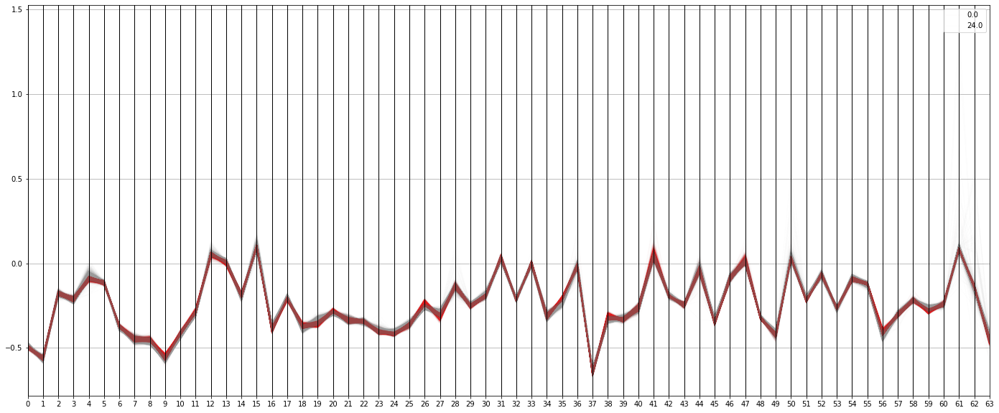

In [31]:
parallel_plot_sorted(0, 24, inn, model_path)